#Random ohne Feature Engineering (ohne Original Smulierten VO₂ Werte)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  1 – Proband 1:
 RMSE = 0.420,  R2 = 0.819,  MAPE = 32.13%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


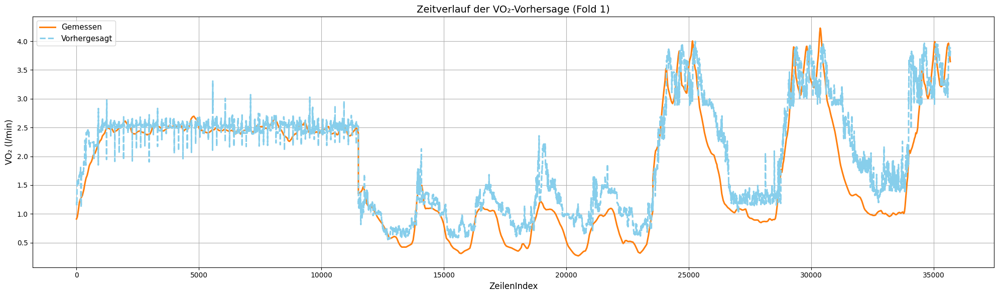

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  2 – Proband 2:
 RMSE = 0.405,  R2 = 0.843,  MAPE = 27.29%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


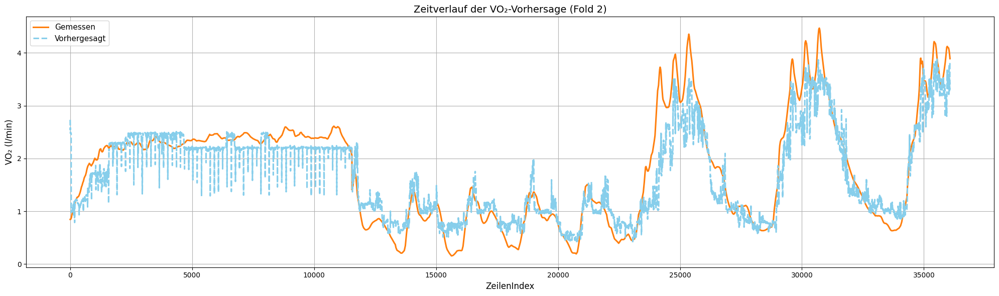

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  3 – Proband 3:
 RMSE = 0.839,  R2 = 0.099,  MAPE = 30.43%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


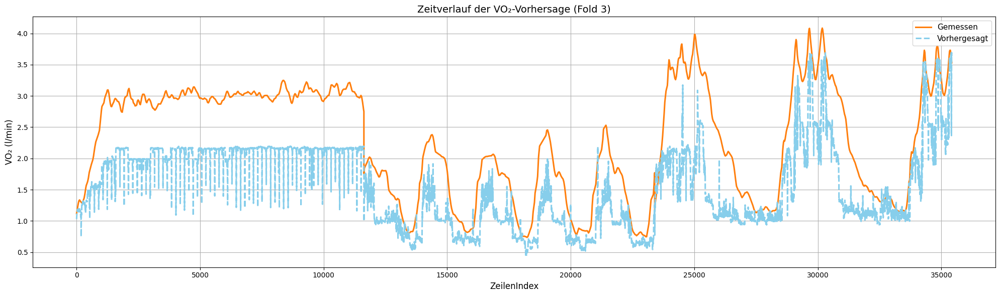

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  4 – Proband 4:
 RMSE = 0.429,  R2 = 0.764,  MAPE = 34.64%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


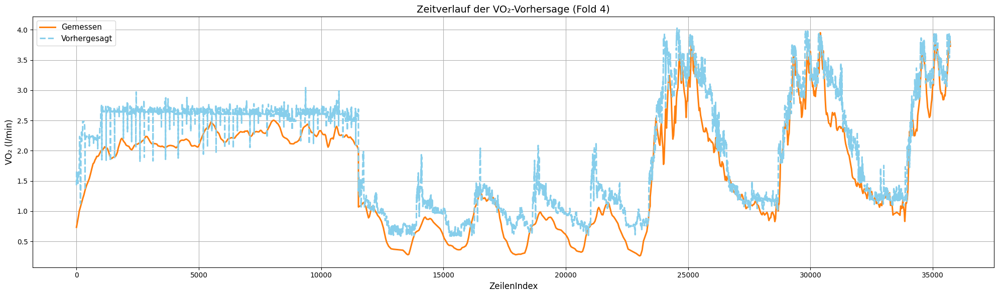

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  5 – Proband 5:
 RMSE = 0.339,  R2 = 0.876,  MAPE = 27.73%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


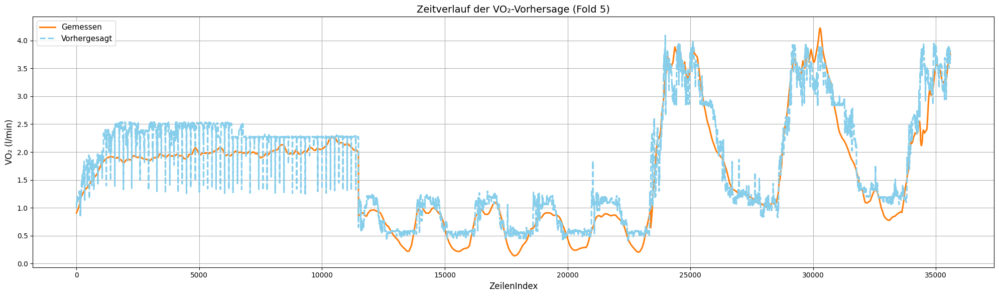

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  6 – Proband 6:
 RMSE = 0.487,  R2 = 0.633,  MAPE = 36.71%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


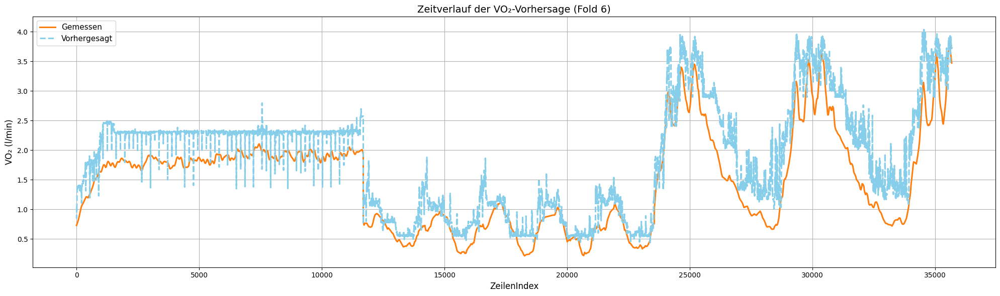

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  7 – Proband 7:
 RMSE = 0.274,  R2 = 0.914,  MAPE = 18.34%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


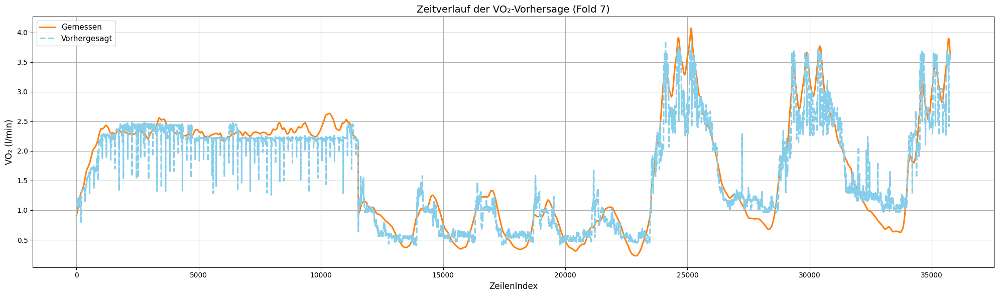

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  8 – Proband 8:
 RMSE = 0.741,  R2 = 0.623,  MAPE = 23.16%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


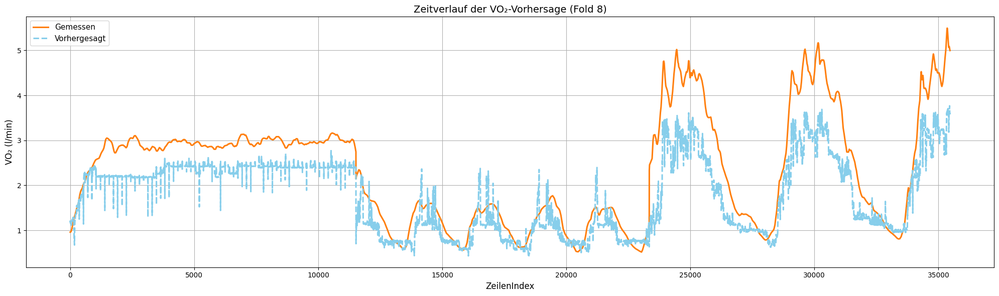

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  9 – Proband 9:
 RMSE = 0.632,  R2 = 0.593,  MAPE = 36.24%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


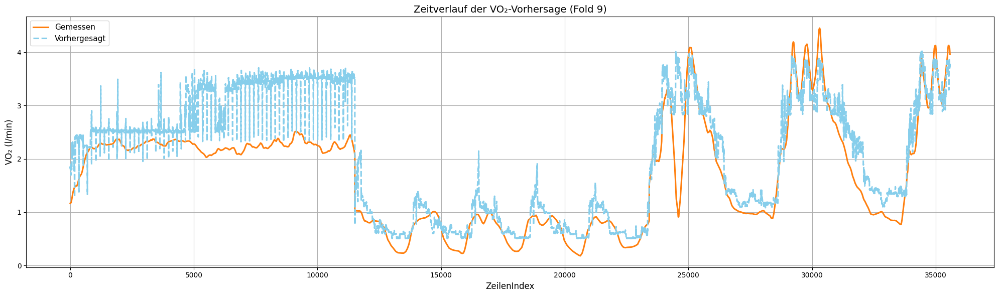

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 10 – Proband 10:
 RMSE = 0.510,  R2 = 0.676,  MAPE = 31.76%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


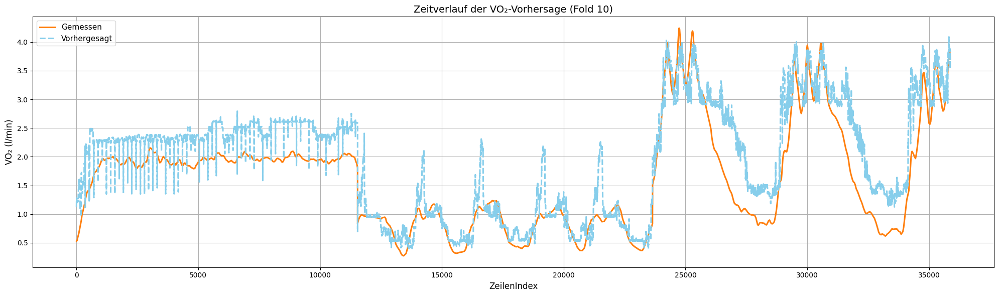

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 11 – Proband 11:
 RMSE = 0.446,  R2 = 0.801,  MAPE = 19.00%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


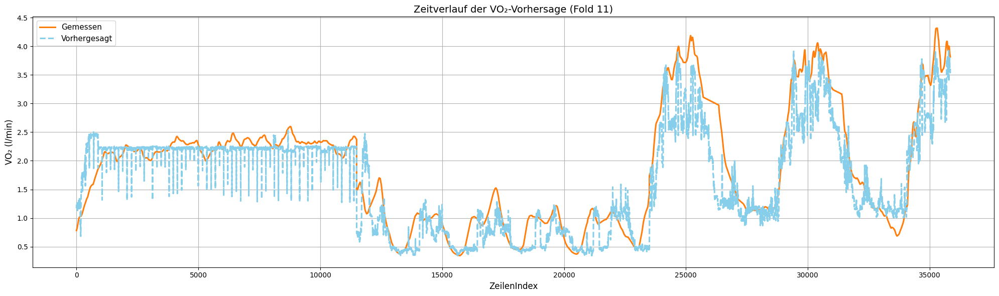

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 12 – Proband 12:
 RMSE = 0.510,  R2 = 0.758,  MAPE = 19.08%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


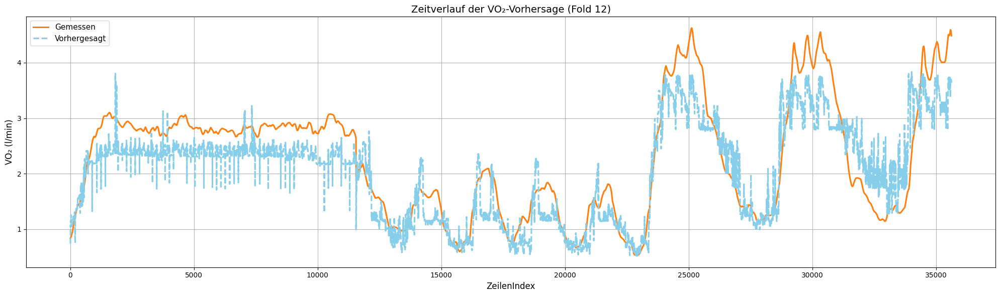

GESAMTERGEBNIS:
Durchschnitt RMSE: 0.503
Durchschnitt R²   : 0.700
Durchschnitt MAPE : 28.04%
R² über alle Daten: 0.730


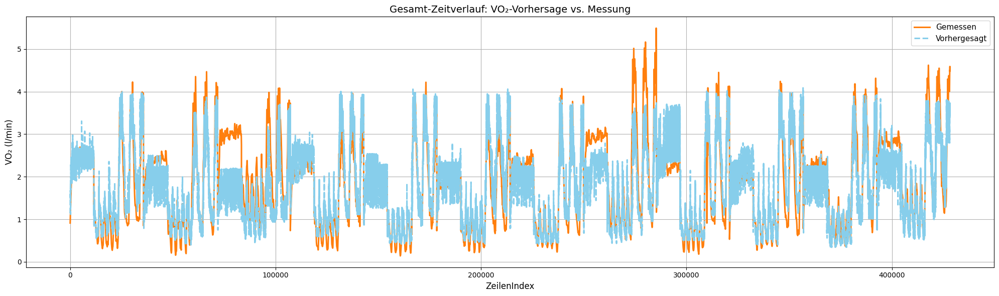

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneGroupOut, GroupKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)

#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

# Missing Indicator
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
loesch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "original_sim oxygen uptake (l/min)","Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=loesch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values

#Pipeline und Parameter für HyperSuche
pipeline = Pipeline([("scaler", StandardScaler()),("rf", RandomForestRegressor(random_state=SEED))])
parameter = { "rf__n_estimators": [100, 200], "rf__max_depth": [10, None], "rf__min_samples_split": [2, 5], "rf__min_samples_leaf": [1, 2],"rf__max_features": ["sqrt"]}

innere_cv = GroupKFold(n_splits=3)
Leave = LeaveOneGroupOut()

suche = RandomizedSearchCV(pipeline, parameter, n_iter=5, cv=innere_cv, scoring="neg_root_mean_squared_error", n_jobs=1, verbose=1, random_state=SEED)

# Validierung (immer 11 Folds und 1 Proband als Test)
rmse_liste, r2_liste, mape_liste = [], [], []
y_alleWahre, y_alleVorhersage = [], []

for fold, (train, test) in enumerate(Leave.split(X, y, gruppen), 1):
    suche.fit(X[train], y[train], groups=gruppen[train])
    y_pred = suche.predict(X[test])
    y_true = y[test]

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mape_liste.append(mape)
    y_alleWahre.extend(y_true)
    y_alleVorhersage.extend(y_pred)

    print(f"Fold {fold:2d} – Proband {gruppen[test][0]}:")
    print(f" RMSE = {rmse:.3f},  R2 = {r2:.3f},  MAPE = {mape:.2f}%")
    print(f" Beste Parameter: {suche.best_params_}")

    color_true = "#ff7f0e"     
    color_pred = "#87ceeb"     

  # Plot erstellen
    plt.figure(figsize=(20, 6))  
    plt.plot(y_true, label="Gemessen", linewidth=2.2, color=color_true)
    plt.plot(y_pred, "--", label="Vorhergesagt", linewidth=2.2, color=color_pred)
    plt.xlabel("ZeilenIndex", fontsize=12)
    plt.ylabel("VO₂ (l/min)", fontsize=12)
    plt.title(f"Zeitverlauf der VO₂-Vorhersage (Fold {fold})", fontsize=14)
    plt.legend(fontsize=11)
    plt.grid(True)
    plt.tight_layout()

    plt.show()
    plt.savefig(f"RF_ohnefeatures_Fold_{fold}.png", dpi=300, bbox_inches='tight')
    plt.close()



r2_gesamt = r2_score(y_alleWahre, y_alleVorhersage)

print("GESAMTERGEBNIS:")
print(f"Durchschnitt RMSE: {np.mean(rmse_liste):.3f}")
print(f"Durchschnitt R²   : {np.mean(r2_liste):.3f}")
print(f"Durchschnitt MAPE : {np.mean(mape_liste):.2f}%")
print(f"R² über alle Daten: {r2_gesamt:.3f}")

color_true = "#ff7f0e"   
color_pred = "#87ceeb"   

plt.figure(figsize=(20, 6))
plt.plot(y_alleWahre, label="Gemessen", linewidth=2.2, color=color_true)
plt.plot(y_alleVorhersage, "--", label="Vorhergesagt", linewidth=2.2, color=color_pred)
plt.xlabel("ZeilenIndex", fontsize=12)
plt.ylabel("VO₂ (l/min)", fontsize=12)
plt.title("Gesamt-Zeitverlauf: VO₂-Vorhersage vs. Messung", fontsize=14)
plt.legend(fontsize=11)
plt.grid(True)
plt.tight_layout()

plt.show()

plt.savefig("gesamt_zeitverlauf_RF_ohneFeatures.png", dpi=300, bbox_inches='tight')
plt.close()





#Random Forest mit Feature Engineering (ohne Original Smulierten VO₂ Werte)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  1 – Proband 1:
 RMSE = 0.382,  R2 = 0.850,  MAPE = 29.50%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


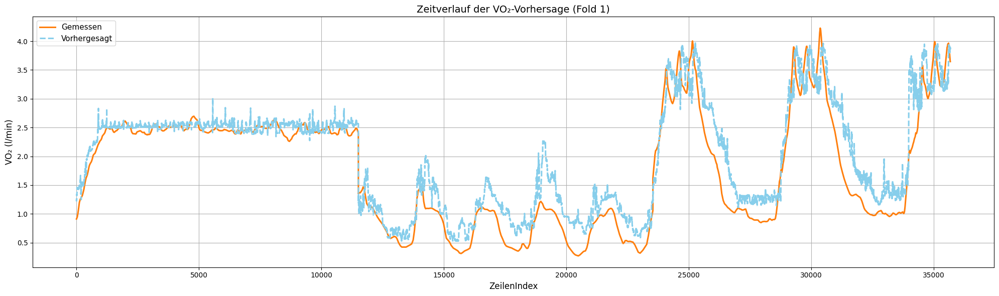

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  2 – Proband 2:
 RMSE = 0.378,  R2 = 0.863,  MAPE = 26.99%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


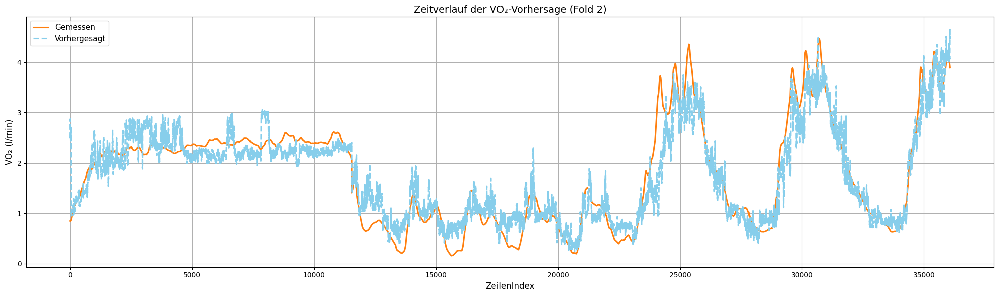

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  3 – Proband 3:
 RMSE = 0.799,  R2 = 0.183,  MAPE = 29.98%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


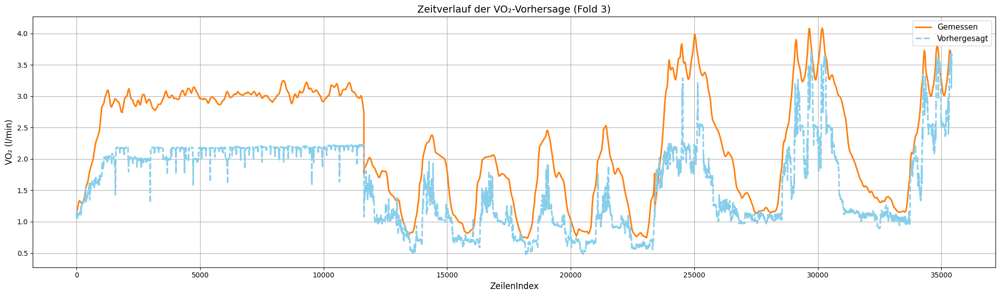

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  4 – Proband 4:
 RMSE = 0.470,  R2 = 0.718,  MAPE = 31.29%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


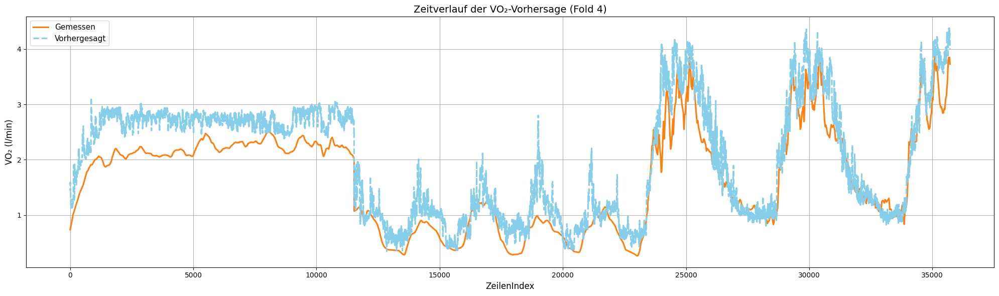

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  5 – Proband 5:
 RMSE = 0.346,  R2 = 0.871,  MAPE = 26.26%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


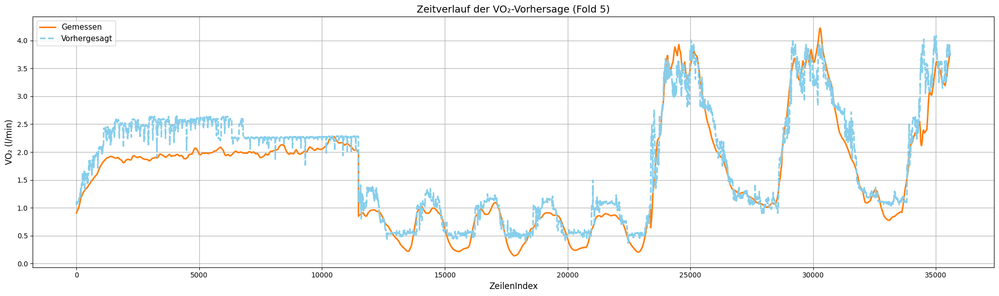

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  6 – Proband 6:
 RMSE = 0.462,  R2 = 0.669,  MAPE = 34.06%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


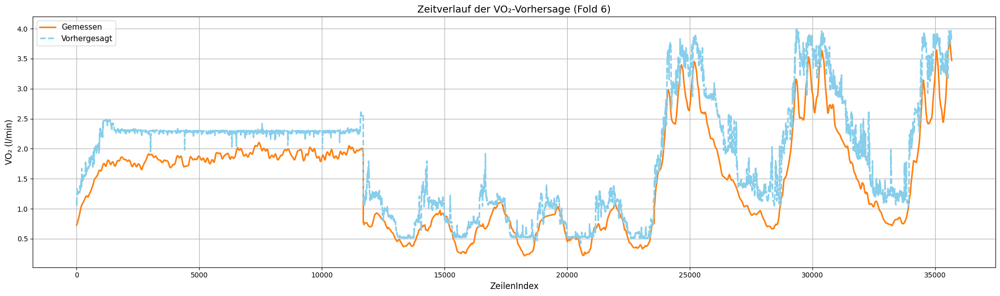

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  7 – Proband 7:
 RMSE = 0.239,  R2 = 0.935,  MAPE = 16.50%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


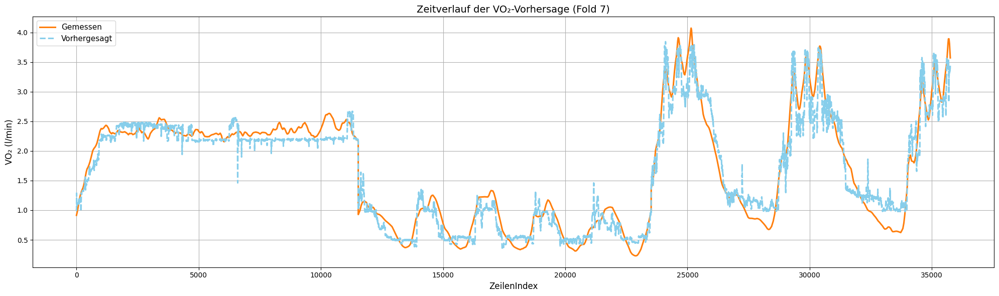

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  8 – Proband 8:
 RMSE = 0.709,  R2 = 0.655,  MAPE = 22.78%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


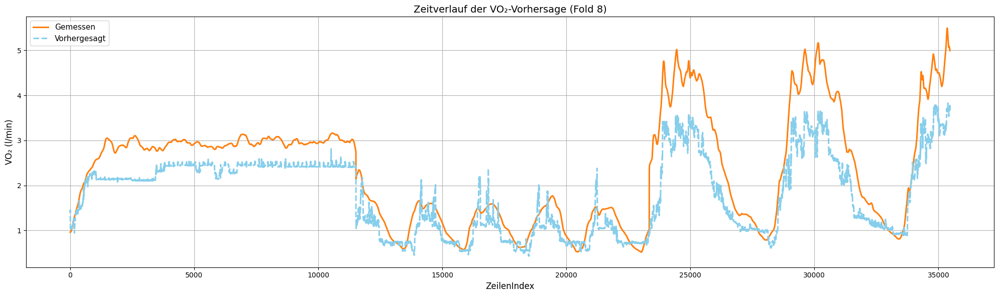

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold  9 – Proband 9:
 RMSE = 0.600,  R2 = 0.633,  MAPE = 33.30%
 Beste Parameter: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


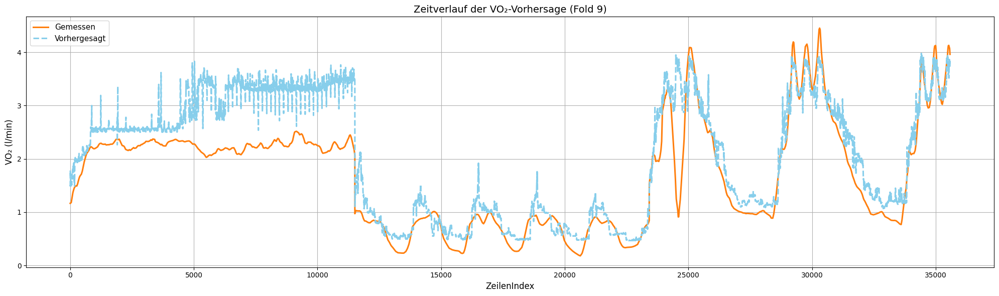

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 10 – Proband 10:
 RMSE = 0.525,  R2 = 0.657,  MAPE = 30.11%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': None}


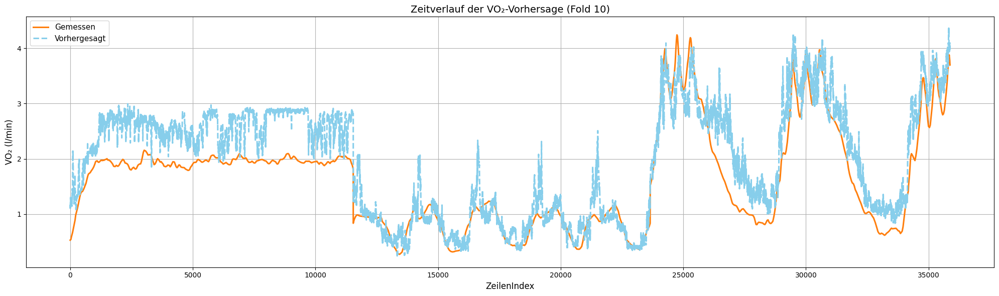

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 11 – Proband 11:
 RMSE = 0.403,  R2 = 0.837,  MAPE = 17.69%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


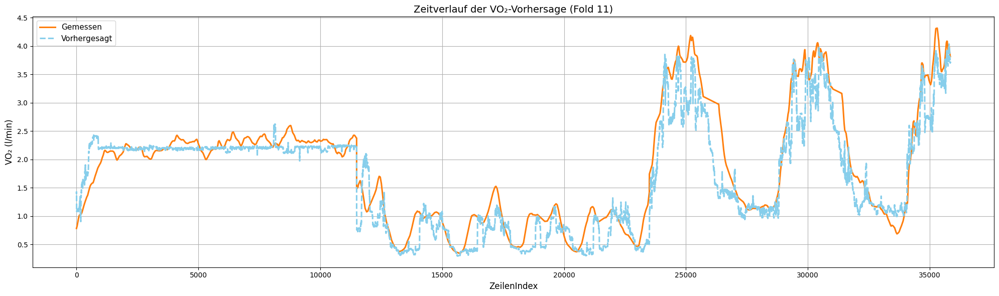

Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fold 12 – Proband 12:
 RMSE = 0.489,  R2 = 0.777,  MAPE = 17.70%
 Beste Parameter: {'rf__n_estimators': 200, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}


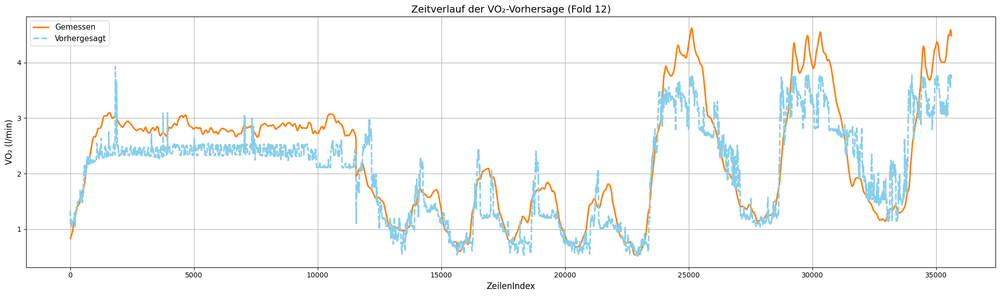

GESAMTERGEBNIS:
Durchschnitt RMSE: 0.483
Durchschnitt R²   : 0.721
Durchschnitt MAPE : 26.35%
R² über alle Daten: 0.750


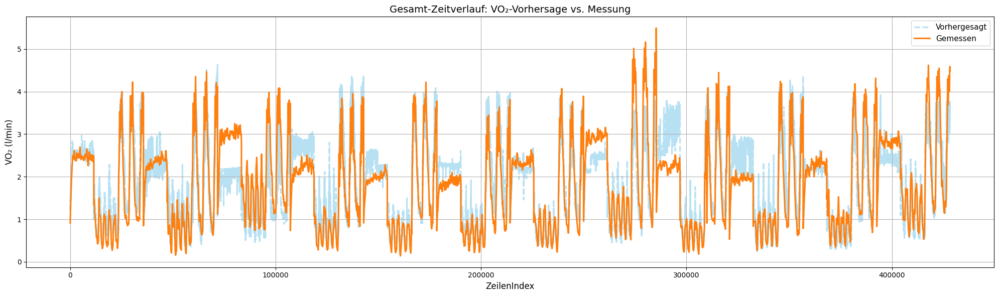

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneGroupOut, GroupKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)

#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

for spalte in wichtige_spalten:
    gruppiert = df.groupby(["Proband", "TestArt"])[spalte]
    df[f"{spalte}_verzoegerung{verzögert}"] = gruppiert.shift(verzögert)
    df[f"{spalte}_differenz{delta}"] = gruppiert.diff(delta)
    df[f"{spalte}_mittelwert{roll}"] = gruppiert.transform(lambda x: x.rolling(roll, min_periods=1).mean())

# Interaktionsmerkmal
df["HR_Pmet_interaktion"] = df["HR"] * df["Pmet (W/kg)"]
df["speed_acc_interaktion"] = df["speed (m/s)"] * df["acc (m/s2)"]

# Relative Zeit
df["rel_zeit"] = df.groupby(["Proband", "TestArt"])["time (MPM)"].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

# Missing Indicator
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
loesch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "original_sim oxygen uptake (l/min)","Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=loesch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values

#Pipeline und Parameter für HyperSuche
pipeline = Pipeline([("scaler", StandardScaler()),("rf", RandomForestRegressor(random_state=SEED))])
parameter = { "rf__n_estimators": [100, 200], "rf__max_depth": [10, None], "rf__min_samples_split": [2, 5],
              "rf__min_samples_leaf": [1, 2],"rf__max_features": ["sqrt"]}

innere_cv = GroupKFold(n_splits=3)
Leave = LeaveOneGroupOut()

suche = RandomizedSearchCV(pipeline, parameter, n_iter=5, cv=innere_cv, scoring="neg_root_mean_squared_error", n_jobs=1, verbose=1, random_state=SEED)

# Validierung (immer 11 Folds und 1 Proband als Test)
rmse_liste, r2_liste, mape_liste = [], [], []
y_alleWahre, y_alleVorhersage = [], []

for fold, (train, test) in enumerate(Leave.split(X, y, gruppen), 1):
    suche.fit(X[train], y[train], groups=gruppen[train])
    y_pred = suche.predict(X[test])
    y_true = y[test]

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mape_liste.append(mape)
    y_alleWahre.extend(y_true)
    y_alleVorhersage.extend(y_pred)

    print(f"Fold {fold:2d} – Proband {gruppen[test][0]}:")
    print(f" RMSE = {rmse:.3f},  R2 = {r2:.3f},  MAPE = {mape:.2f}%")
    print(f" Beste Parameter: {suche.best_params_}")

    color_true = "#ff7f0e"    
    color_pred = "#87ceeb"     

  # Plot erstellen
    plt.figure(figsize=(20, 6))  
    plt.plot(y_true, label="Gemessen", linewidth=2.2, color=color_true)
    plt.plot(y_pred, "--", label="Vorhergesagt", linewidth=2.2, color=color_pred)
    plt.xlabel("ZeilenIndex", fontsize=12)
    plt.ylabel("VO₂ (l/min)", fontsize=12)
    plt.title(f"Zeitverlauf der VO₂-Vorhersage (Fold {fold})", fontsize=14)
    plt.legend(fontsize=11)
    plt.grid(True)
    plt.tight_layout()

    plt.show()
    plt.savefig(f"RF_ohnefeatures_Fold_{fold}.png", dpi=300, bbox_inches='tight')
    plt.close()



# R² über alle Daten berechnen
r2_gesamt = r2_score(y_alleWahre, y_alleVorhersage)

# Metriken anzeigen
print("GESAMTERGEBNIS:")
print(f"Durchschnitt RMSE: {np.mean(rmse_liste):.3f}")
print(f"Durchschnitt R²   : {np.mean(r2_liste):.3f}")
print(f"Durchschnitt MAPE : {np.mean(mape_liste):.2f}%")
print(f"R² über alle Daten: {r2_gesamt:.3f}")

# Plotfarben
color_true = "#ff7f0e"   
color_pred = "#87ceeb"   

# Zeitverlauf-Plot
plt.figure(figsize=(20, 6))
plt.plot(y_alleVorhersage, "--", label="Vorhergesagt", linewidth=2.2, color=color_pred, alpha=0.6, zorder=1) 
plt.plot(y_alleWahre, label="Gemessen", linewidth=2.2, color=color_true, alpha=1.0, zorder=2)  
plt.xlabel("ZeilenIndex", fontsize=12)
plt.ylabel("VO₂ (l/min)", fontsize=12)
plt.title("Gesamt-Zeitverlauf: VO₂-Vorhersage vs. Messung", fontsize=14)
plt.legend(fontsize=11)
plt.grid(True)
plt.tight_layout()

plt.show()

plt.savefig("gesamt_zeitverlauf_RF_ohneFeatures.png", dpi=300, bbox_inches='tight')
plt.close()





#LSTM ohne Feature Engineering (ohne Original Smulierten VO₂ Werte)


 Fold 1 – Test-Proband 1
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 75s 13ms/step - loss: 0.0188 - mae: 0.1447 - mse: 0.0376 - val_loss: 0.0189 - val_mae: 0.1611 - val_mse: 0.0379
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 71s 13ms/step - loss: 0.0149 - mae: 0.1281 - mse: 0.0298 - val_loss: 0.0186 - val_mae: 0.1561 - val_mse: 0.0372
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0144 - mae: 0.1253 - mse: 0.0288 - val_loss: 0.0188 - val_mae: 0.1557 - val_mse: 0.0375
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0140 - mae: 0.1230 - mse: 0.0281 - val_loss: 0.0205 - val_mae: 0.1621 - val_mse: 0.0410
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0139 - mae: 0.1220 - mse: 0.0277 - val_loss: 0.0192 - val_mae: 0.1581 - val_mse: 0.0384
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0138 - mae: 0.1214 - mse: 0.0275 - val_loss: 0.0198 - val_mae: 0.1590 - val_mse: 0.0397
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms

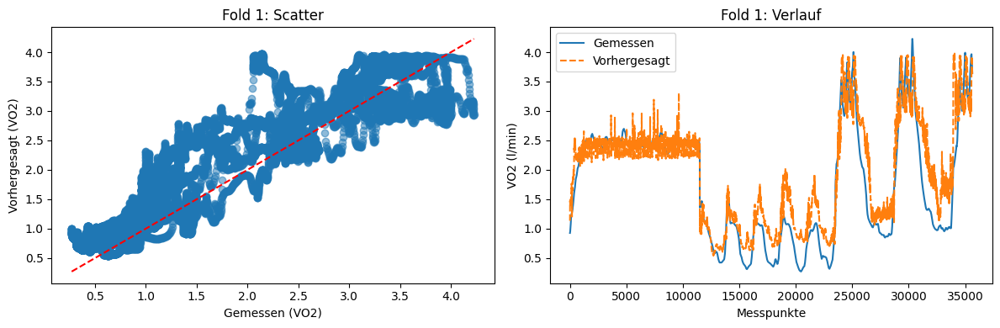


 Fold 2 – Test-Proband 2
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 84s 15ms/step - loss: 0.0186 - mae: 0.1436 - mse: 0.0372 - val_loss: 0.0194 - val_mae: 0.1624 - val_mse: 0.0387
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 86s 16ms/step - loss: 0.0150 - mae: 0.1279 - mse: 0.0299 - val_loss: 0.0187 - val_mae: 0.1576 - val_mse: 0.0373
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 84s 15ms/step - loss: 0.0145 - mae: 0.1247 - mse: 0.0289 - val_loss: 0.0181 - val_mae: 0.1529 - val_mse: 0.0361
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 81s 15ms/step - loss: 0.0141 - mae: 0.1225 - mse: 0.0282 - val_loss: 0.0200 - val_mae: 0.1603 - val_mse: 0.0400
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 83s 15ms/step - loss: 0.0140 - mae: 0.1218 - mse: 0.0280 - val_loss: 0.0180 - val_mae: 0.1528 - val_mse: 0.0359
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 80s 15ms/step - loss: 0.0138 - mae: 0.1210 - mse: 0.0276 - val_loss: 0.0187 - val_mae: 0.1570 - val_mse: 0.0375
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 80s 15ms

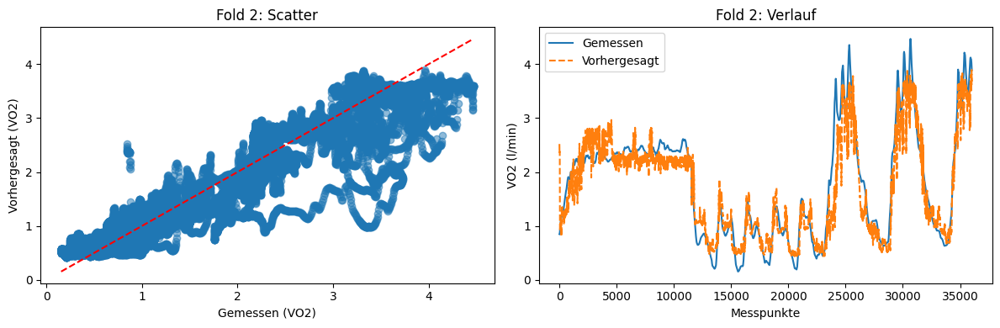


 Fold 3 – Test-Proband 3
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 85s 15ms/step - loss: 0.0151 - mae: 0.1265 - mse: 0.0302 - val_loss: 0.0168 - val_mae: 0.1498 - val_mse: 0.0336
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0119 - mae: 0.1110 - mse: 0.0238 - val_loss: 0.0160 - val_mae: 0.1401 - val_mse: 0.0320
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 79s 14ms/step - loss: 0.0114 - mae: 0.1075 - mse: 0.0228 - val_loss: 0.0210 - val_mae: 0.1636 - val_mse: 0.0420
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 79s 14ms/step - loss: 0.0112 - mae: 0.1062 - mse: 0.0223 - val_loss: 0.0179 - val_mae: 0.1528 - val_mse: 0.0357
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 81s 15ms/step - loss: 0.0110 - mae: 0.1052 - mse: 0.0220 - val_loss: 0.0179 - val_mae: 0.1525 - val_mse: 0.0358
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 79s 14ms/step - loss: 0.0109 - mae: 0.1050 - mse: 0.0219 - val_loss: 0.0189 - val_mae: 0.1580 - val_mse: 0.0379
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms

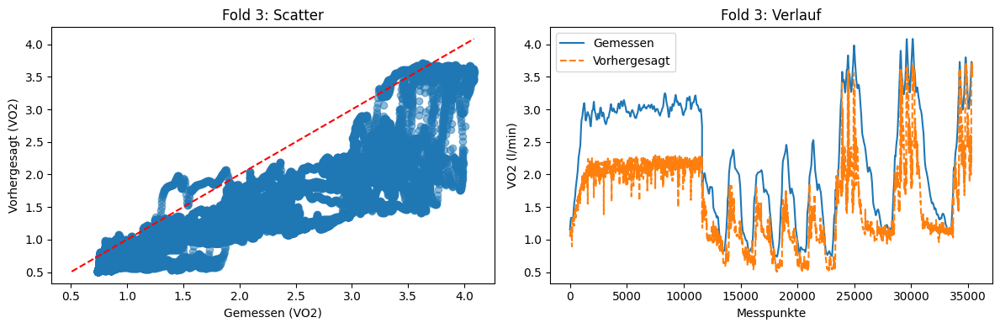


 Fold 4 – Test-Proband 4
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 78s 14ms/step - loss: 0.0178 - mae: 0.1412 - mse: 0.0356 - val_loss: 0.0153 - val_mae: 0.1423 - val_mse: 0.0306
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0149 - mae: 0.1275 - mse: 0.0297 - val_loss: 0.0134 - val_mae: 0.1271 - val_mse: 0.0269
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0142 - mae: 0.1235 - mse: 0.0283 - val_loss: 0.0154 - val_mae: 0.1361 - val_mse: 0.0308
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0139 - mae: 0.1219 - mse: 0.0279 - val_loss: 0.0150 - val_mae: 0.1310 - val_mse: 0.0300
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 82s 15ms/step - loss: 0.0137 - mae: 0.1210 - mse: 0.0275 - val_loss: 0.0163 - val_mae: 0.1398 - val_mse: 0.0326
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 84s 15ms/step - loss: 0.0136 - mae: 0.1202 - mse: 0.0271 - val_loss: 0.0167 - val_mae: 0.1389 - val_mse: 0.0334
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 82s 15ms

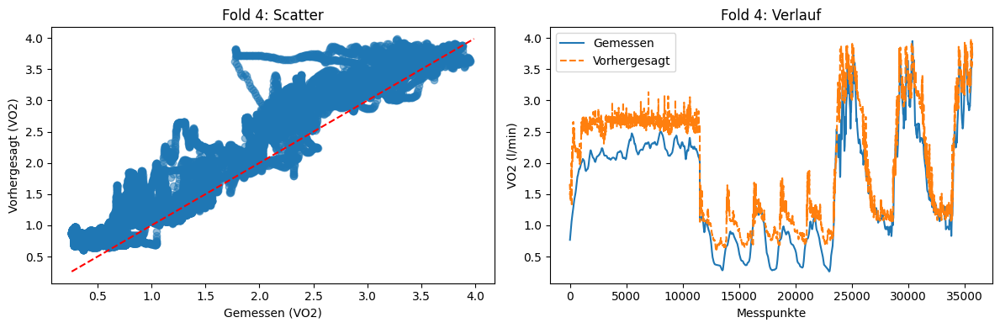


 Fold 5 – Test-Proband 5
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 86s 15ms/step - loss: 0.0185 - mae: 0.1446 - mse: 0.0371 - val_loss: 0.0200 - val_mae: 0.1637 - val_mse: 0.0400
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 83s 15ms/step - loss: 0.0153 - mae: 0.1293 - mse: 0.0307 - val_loss: 0.0207 - val_mae: 0.1668 - val_mse: 0.0414
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 83s 15ms/step - loss: 0.0149 - mae: 0.1262 - mse: 0.0297 - val_loss: 0.0216 - val_mae: 0.1678 - val_mse: 0.0432
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 82s 15ms/step - loss: 0.0145 - mae: 0.1243 - mse: 0.0289 - val_loss: 0.0181 - val_mae: 0.1534 - val_mse: 0.0362
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0143 - mae: 0.1233 - mse: 0.0286 - val_loss: 0.0183 - val_mae: 0.1553 - val_mse: 0.0365
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 80s 15ms/step - loss: 0.0141 - mae: 0.1225 - mse: 0.0283 - val_loss: 0.0188 - val_mae: 0.1548 - val_mse: 0.0376
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 81s 15ms

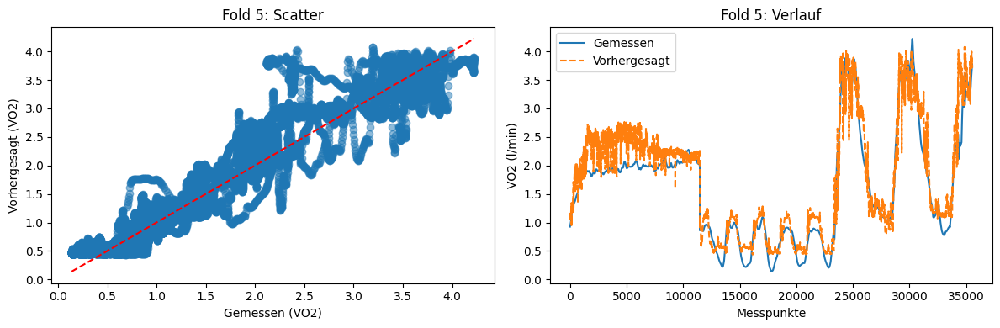


 Fold 6 – Test-Proband 6
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 85s 15ms/step - loss: 0.0172 - mae: 0.1374 - mse: 0.0343 - val_loss: 0.0183 - val_mae: 0.1583 - val_mse: 0.0367
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 81s 15ms/step - loss: 0.0141 - mae: 0.1228 - mse: 0.0281 - val_loss: 0.0168 - val_mae: 0.1483 - val_mse: 0.0336
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 78s 14ms/step - loss: 0.0136 - mae: 0.1203 - mse: 0.0272 - val_loss: 0.0173 - val_mae: 0.1493 - val_mse: 0.0346
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0133 - mae: 0.1186 - mse: 0.0266 - val_loss: 0.0174 - val_mae: 0.1481 - val_mse: 0.0349
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 81s 15ms/step - loss: 0.0131 - mae: 0.1179 - mse: 0.0263 - val_loss: 0.0189 - val_mae: 0.1562 - val_mse: 0.0378
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 78s 14ms/step - loss: 0.0130 - mae: 0.1170 - mse: 0.0260 - val_loss: 0.0171 - val_mae: 0.1468 - val_mse: 0.0342
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms

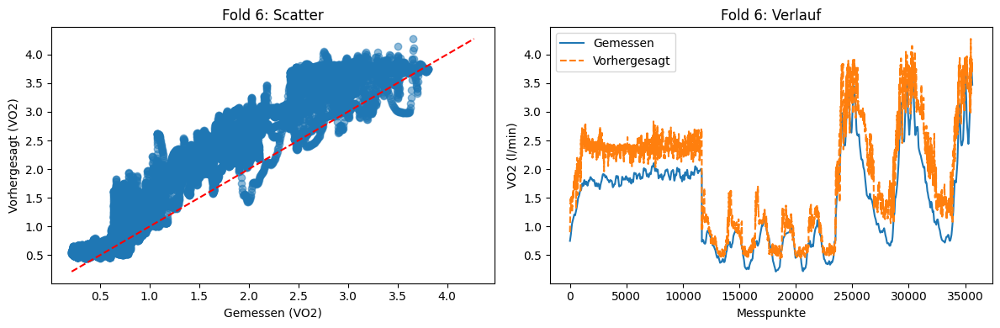


 Fold 7 – Test-Proband 7
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0190 - mae: 0.1457 - mse: 0.0381 - val_loss: 0.0186 - val_mae: 0.1584 - val_mse: 0.0373
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 83s 14ms/step - loss: 0.0153 - mae: 0.1293 - mse: 0.0306 - val_loss: 0.0168 - val_mae: 0.1470 - val_mse: 0.0335
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 79s 14ms/step - loss: 0.0147 - mae: 0.1264 - mse: 0.0295 - val_loss: 0.0200 - val_mae: 0.1635 - val_mse: 0.0400
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0144 - mae: 0.1244 - mse: 0.0288 - val_loss: 0.0179 - val_mae: 0.1522 - val_mse: 0.0358
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0142 - mae: 0.1232 - mse: 0.0283 - val_loss: 0.0182 - val_mae: 0.1529 - val_mse: 0.0364
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0141 - mae: 0.1227 - mse: 0.0283 - val_loss: 0.0189 - val_mae: 0.1555 - val_mse: 0.0377
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 70s 13ms

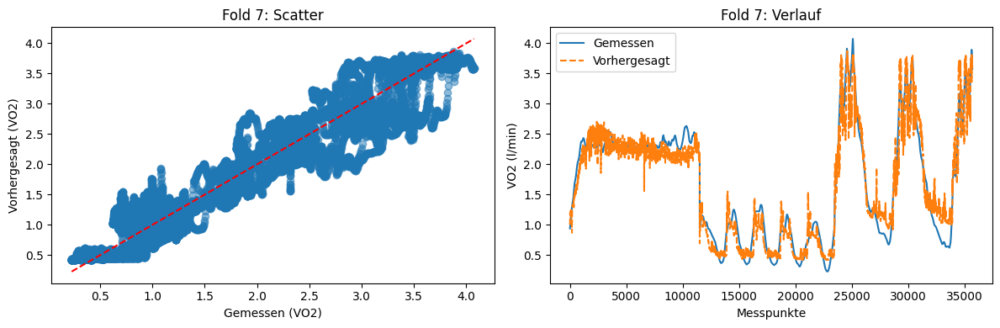


 Fold 8 – Test-Proband 8
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0153 - mae: 0.1289 - mse: 0.0307 - val_loss: 0.0226 - val_mae: 0.1778 - val_mse: 0.0451
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 70s 13ms/step - loss: 0.0120 - mae: 0.1130 - mse: 0.0241 - val_loss: 0.0206 - val_mae: 0.1682 - val_mse: 0.0413
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 69s 12ms/step - loss: 0.0115 - mae: 0.1099 - mse: 0.0231 - val_loss: 0.0249 - val_mae: 0.1842 - val_mse: 0.0498
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 69s 13ms/step - loss: 0.0113 - mae: 0.1085 - mse: 0.0226 - val_loss: 0.0241 - val_mae: 0.1779 - val_mse: 0.0482
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 69s 13ms/step - loss: 0.0111 - mae: 0.1073 - mse: 0.0221 - val_loss: 0.0232 - val_mae: 0.1807 - val_mse: 0.0465
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 70s 13ms/step - loss: 0.0110 - mae: 0.1068 - mse: 0.0220 - val_loss: 0.0259 - val_mae: 0.1886 - val_mse: 0.0519
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 70s 13ms

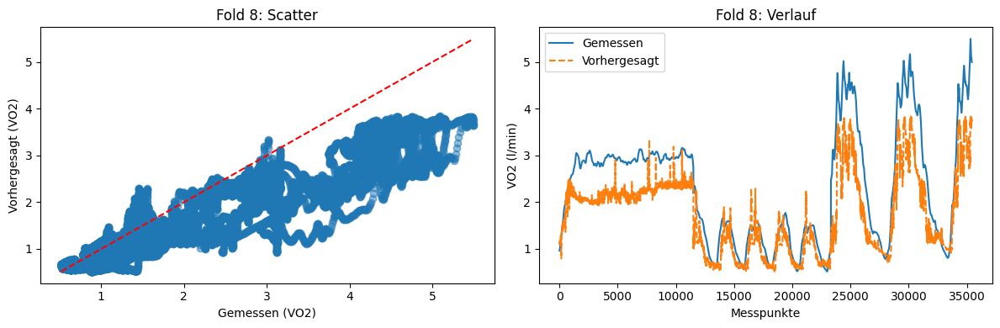


 Fold 9 – Test-Proband 9
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 83s 15ms/step - loss: 0.0179 - mae: 0.1418 - mse: 0.0358 - val_loss: 0.0172 - val_mae: 0.1535 - val_mse: 0.0343
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 86s 16ms/step - loss: 0.0147 - mae: 0.1278 - mse: 0.0293 - val_loss: 0.0177 - val_mae: 0.1539 - val_mse: 0.0354
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 91s 17ms/step - loss: 0.0142 - mae: 0.1257 - mse: 0.0284 - val_loss: 0.0182 - val_mae: 0.1546 - val_mse: 0.0364
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 88s 16ms/step - loss: 0.0139 - mae: 0.1240 - mse: 0.0279 - val_loss: 0.0207 - val_mae: 0.1623 - val_mse: 0.0415
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 88s 16ms/step - loss: 0.0138 - mae: 0.1230 - mse: 0.0277 - val_loss: 0.0187 - val_mae: 0.1553 - val_mse: 0.0374
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 86s 16ms/step - loss: 0.0136 - mae: 0.1220 - mse: 0.0272 - val_loss: 0.0198 - val_mae: 0.1591 - val_mse: 0.0397
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 86s 16ms

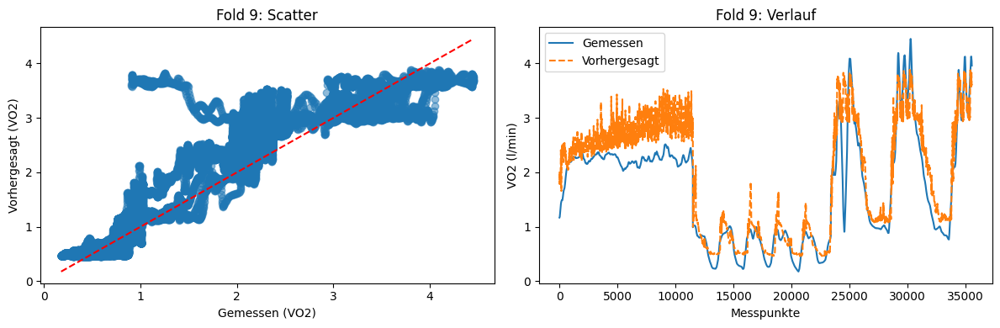


 Fold 10 – Test-Proband 10
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 86s 15ms/step - loss: 0.0172 - mae: 0.1386 - mse: 0.0344 - val_loss: 0.0157 - val_mae: 0.1438 - val_mse: 0.0314
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 85s 15ms/step - loss: 0.0142 - mae: 0.1252 - mse: 0.0283 - val_loss: 0.0182 - val_mae: 0.1510 - val_mse: 0.0364
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 86s 16ms/step - loss: 0.0138 - mae: 0.1231 - mse: 0.0275 - val_loss: 0.0193 - val_mae: 0.1553 - val_mse: 0.0386
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 86s 16ms/step - loss: 0.0136 - mae: 0.1221 - mse: 0.0272 - val_loss: 0.0172 - val_mae: 0.1466 - val_mse: 0.0344
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 89s 16ms/step - loss: 0.0133 - mae: 0.1206 - mse: 0.0265 - val_loss: 0.0194 - val_mae: 0.1574 - val_mse: 0.0389
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 90s 16ms/step - loss: 0.0132 - mae: 0.1203 - mse: 0.0264 - val_loss: 0.0175 - val_mae: 0.1475 - val_mse: 0.0350
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 87s 16

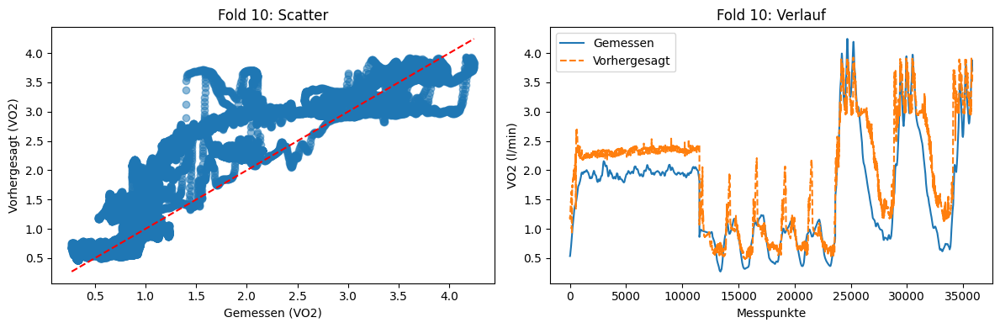


 Fold 11 – Test-Proband 11
Epoch 1/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 77s 13ms/step - loss: 0.0180 - mae: 0.1413 - mse: 0.0360 - val_loss: 0.0198 - val_mae: 0.1656 - val_mse: 0.0396
Epoch 2/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0146 - mae: 0.1252 - mse: 0.0292 - val_loss: 0.0199 - val_mae: 0.1616 - val_mse: 0.0398
Epoch 3/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0141 - mae: 0.1222 - mse: 0.0281 - val_loss: 0.0225 - val_mae: 0.1744 - val_mse: 0.0450
Epoch 4/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0138 - mae: 0.1209 - mse: 0.0276 - val_loss: 0.0208 - val_mae: 0.1654 - val_mse: 0.0416
Epoch 5/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0136 - mae: 0.1199 - mse: 0.0273 - val_loss: 0.0215 - val_mae: 0.1675 - val_mse: 0.0430
Epoch 6/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0135 - mae: 0.1192 - mse: 0.0270 - val_loss: 0.0213 - val_mae: 0.1649 - val_mse: 0.0427
Epoch 7/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 74s 13

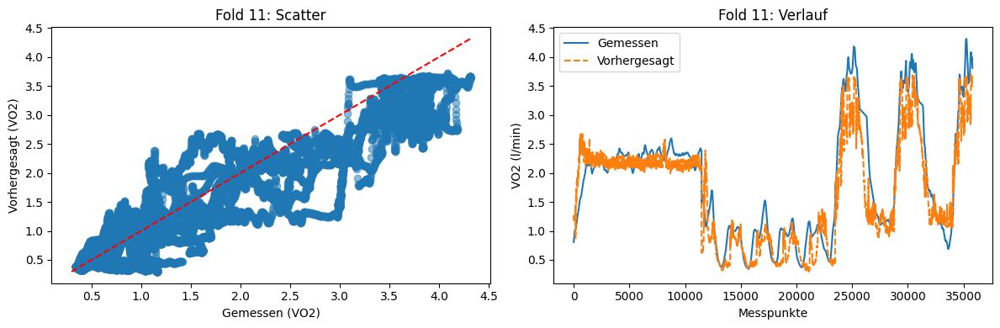


 Fold 12 – Test-Proband 12
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 85s 15ms/step - loss: 0.0182 - mae: 0.1410 - mse: 0.0364 - val_loss: 0.0149 - val_mae: 0.1274 - val_mse: 0.0298
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 85s 15ms/step - loss: 0.0145 - mae: 0.1246 - mse: 0.0289 - val_loss: 0.0170 - val_mae: 0.1314 - val_mse: 0.0340
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 79s 14ms/step - loss: 0.0138 - mae: 0.1212 - mse: 0.0277 - val_loss: 0.0166 - val_mae: 0.1309 - val_mse: 0.0332
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0134 - mae: 0.1192 - mse: 0.0269 - val_loss: 0.0163 - val_mae: 0.1314 - val_mse: 0.0325
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0133 - mae: 0.1185 - mse: 0.0267 - val_loss: 0.0165 - val_mae: 0.1300 - val_mse: 0.0329
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 82s 15ms/step - loss: 0.0132 - mae: 0.1180 - mse: 0.0265 - val_loss: 0.0165 - val_mae: 0.1290 - val_mse: 0.0329
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 82s 15

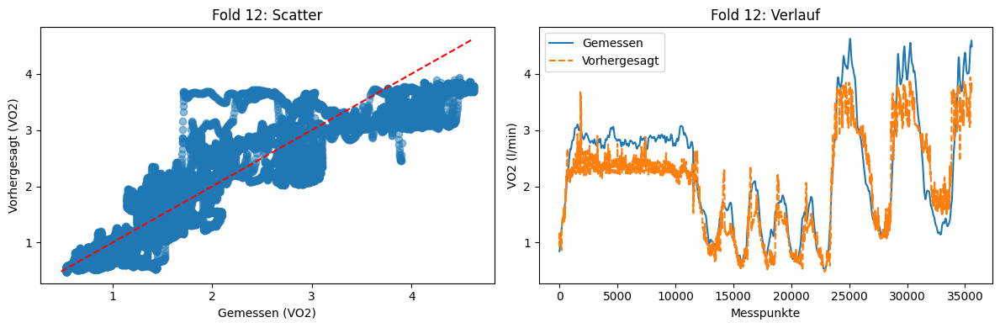


Durchschnitt über alle Folds:
 RMSE: 0.48
 R2 (Fold-Mittel): 0.72
 MAPE: 26.37%
 R2 (gesamt): 0.75


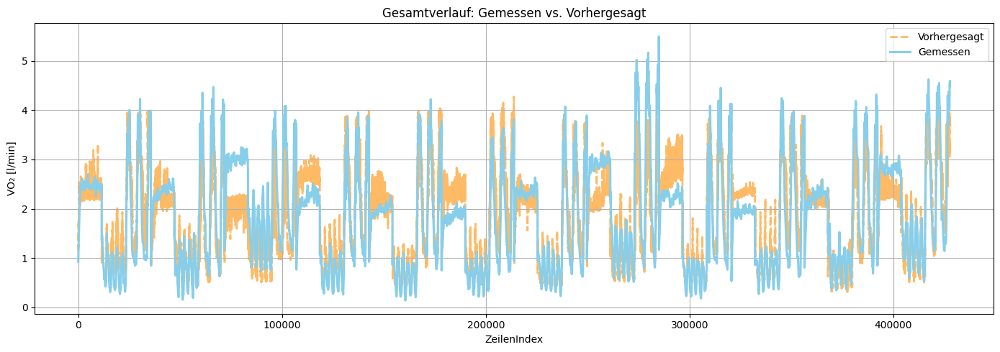

<Figure size 640x480 with 0 Axes>

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "original_sim oxygen uptake (l/min)" , "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values


fenster = 15  

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str) 

for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name)  
    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])       
            y_seq_liste.append(y_gruppe[i + fenster])           
            gruppen_liste.append(gruppen_gruppe[i + fenster])   

X_seq = np.array(X_seq_liste, dtype="float32")    
y_seq = np.array(y_seq_liste, dtype="float32")    
gruppen_seq = np.array(gruppen_liste)            



def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):
    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s

def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()


Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), LSTM(64, return_sequences=True, activation="tanh"), LSTM(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    # Plots
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
print("\nDurchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")

color_pred = "darkorange"
color_true = "skyblue"

plt.figure(figsize=(14, 5))
plt.plot(alle_vorhersagen, "--", label="Vorhergesagt", linewidth=2.0, color=color_pred, alpha=0.6, zorder=1)  
plt.plot(alle_istwerte, label="Gemessen", linewidth=2.2, color=color_true, alpha=1.0, zorder=2) 
plt.xlabel("ZeilenIndex")
plt.ylabel("VO₂ [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()

plt.savefig("LSTM_ohneFeat.png", dpi=300, bbox_inches='tight')




#LSTM mit Feature Engineering (ohne Original Smulierten VO₂ Werte)


 Fold 1 – Test-Proband 1
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0171 - mae: 0.1372 - mse: 0.0342 - val_loss: 0.0204 - val_mae: 0.1585 - val_mse: 0.0408
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0119 - mae: 0.1120 - mse: 0.0239 - val_loss: 0.0203 - val_mae: 0.1587 - val_mse: 0.0406
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0102 - mae: 0.1029 - mse: 0.0204 - val_loss: 0.0222 - val_mae: 0.1681 - val_mse: 0.0444
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0084 - mae: 0.0934 - mse: 0.0168 - val_loss: 0.0226 - val_mae: 0.1689 - val_mse: 0.0452
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 71s 13ms/step - loss: 0.0078 - mae: 0.0902 - mse: 0.0156 - val_loss: 0.0229 - val_mae: 0.1716 - val_mse: 0.0457
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 71s 13ms/step - loss: 0.0074 - mae: 0.0877 - mse: 0.0147 - val_loss: 0.0234 - val_mae: 0.1738 - val_mse: 0.0468
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 71s 13ms

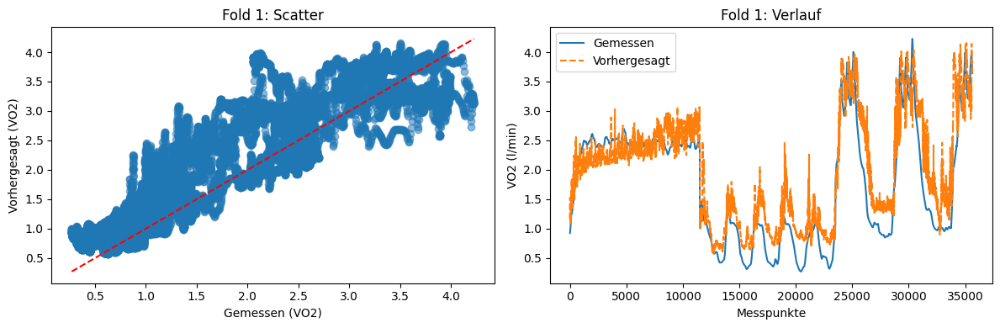


 Fold 2 – Test-Proband 2
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0166 - mae: 0.1358 - mse: 0.0333 - val_loss: 0.0216 - val_mae: 0.1691 - val_mse: 0.0432
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 70s 13ms/step - loss: 0.0121 - mae: 0.1135 - mse: 0.0242 - val_loss: 0.0220 - val_mae: 0.1658 - val_mse: 0.0441
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0096 - mae: 0.1007 - mse: 0.0191 - val_loss: 0.0213 - val_mae: 0.1617 - val_mse: 0.0425
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0085 - mae: 0.0947 - mse: 0.0171 - val_loss: 0.0244 - val_mae: 0.1761 - val_mse: 0.0488
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0078 - mae: 0.0908 - mse: 0.0157 - val_loss: 0.0237 - val_mae: 0.1744 - val_mse: 0.0474
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0074 - mae: 0.0881 - mse: 0.0148 - val_loss: 0.0233 - val_mae: 0.1731 - val_mse: 0.0466
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 71s 13ms

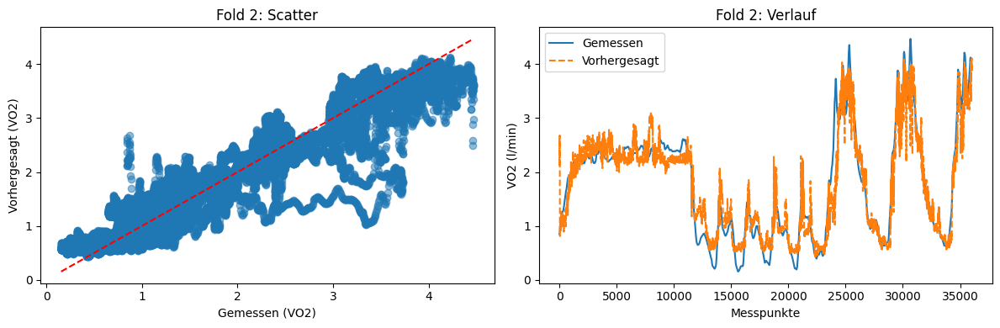


 Fold 3 – Test-Proband 3
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 82s 14ms/step - loss: 0.0137 - mae: 0.1197 - mse: 0.0274 - val_loss: 0.0197 - val_mae: 0.1587 - val_mse: 0.0394
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0098 - mae: 0.0991 - mse: 0.0196 - val_loss: 0.0206 - val_mae: 0.1626 - val_mse: 0.0412
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0091 - mae: 0.0948 - mse: 0.0181 - val_loss: 0.0194 - val_mae: 0.1589 - val_mse: 0.0388
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0079 - mae: 0.0885 - mse: 0.0157 - val_loss: 0.0204 - val_mae: 0.1611 - val_mse: 0.0408
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0069 - mae: 0.0834 - mse: 0.0139 - val_loss: 0.0220 - val_mae: 0.1688 - val_mse: 0.0440
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0065 - mae: 0.0806 - mse: 0.0129 - val_loss: 0.0228 - val_mae: 0.1716 - val_mse: 0.0455
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 78s 14ms

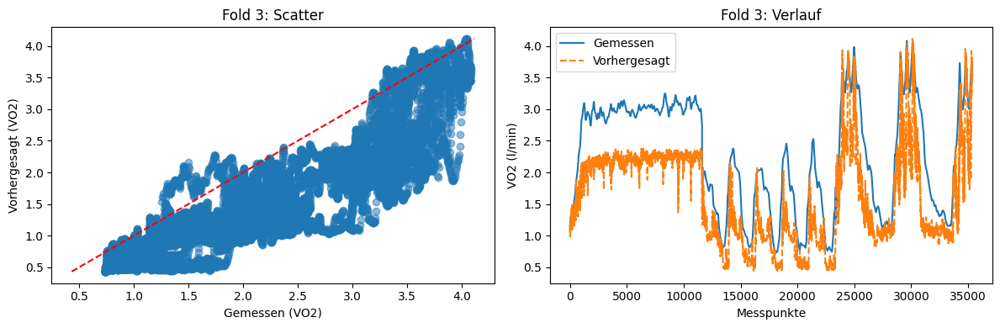


 Fold 4 – Test-Proband 4
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 81s 14ms/step - loss: 0.0164 - mae: 0.1357 - mse: 0.0329 - val_loss: 0.0178 - val_mae: 0.1434 - val_mse: 0.0356
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 83s 15ms/step - loss: 0.0119 - mae: 0.1109 - mse: 0.0238 - val_loss: 0.0213 - val_mae: 0.1613 - val_mse: 0.0427
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 78s 14ms/step - loss: 0.0093 - mae: 0.0980 - mse: 0.0185 - val_loss: 0.0186 - val_mae: 0.1490 - val_mse: 0.0372
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0083 - mae: 0.0930 - mse: 0.0166 - val_loss: 0.0224 - val_mae: 0.1644 - val_mse: 0.0448
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0077 - mae: 0.0897 - mse: 0.0154 - val_loss: 0.0214 - val_mae: 0.1617 - val_mse: 0.0427
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0072 - mae: 0.0870 - mse: 0.0145 - val_loss: 0.0225 - val_mae: 0.1665 - val_mse: 0.0449
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms

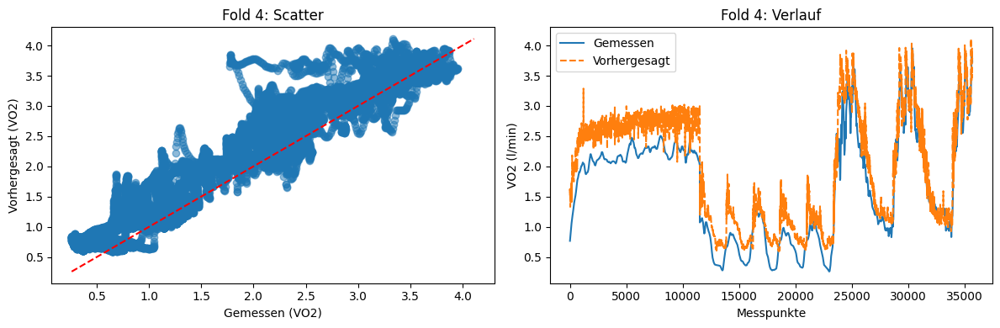


 Fold 5 – Test-Proband 5
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0170 - mae: 0.1374 - mse: 0.0341 - val_loss: 0.0233 - val_mae: 0.1738 - val_mse: 0.0466
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0124 - mae: 0.1140 - mse: 0.0247 - val_loss: 0.0211 - val_mae: 0.1596 - val_mse: 0.0421
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0093 - mae: 0.0991 - mse: 0.0187 - val_loss: 0.0218 - val_mae: 0.1659 - val_mse: 0.0436
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0085 - mae: 0.0939 - mse: 0.0170 - val_loss: 0.0232 - val_mae: 0.1741 - val_mse: 0.0464
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0079 - mae: 0.0904 - mse: 0.0157 - val_loss: 0.0249 - val_mae: 0.1789 - val_mse: 0.0498
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 72s 13ms/step - loss: 0.0073 - mae: 0.0872 - mse: 0.0147 - val_loss: 0.0235 - val_mae: 0.1760 - val_mse: 0.0471
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 72s 13ms

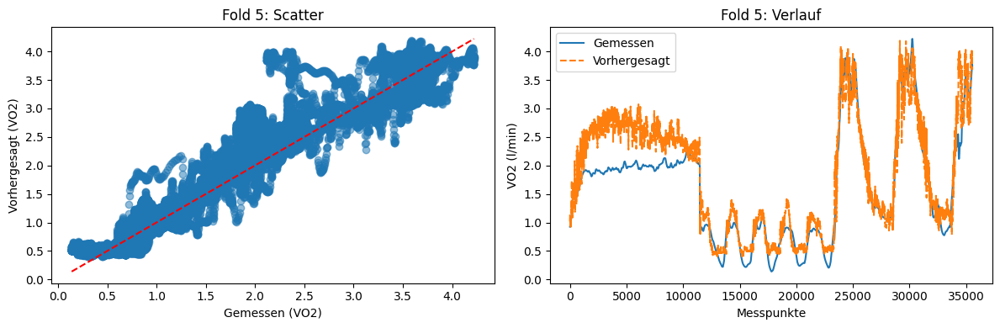


 Fold 6 – Test-Proband 6
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 83s 15ms/step - loss: 0.0156 - mae: 0.1304 - mse: 0.0311 - val_loss: 0.0188 - val_mae: 0.1551 - val_mse: 0.0377
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 80s 14ms/step - loss: 0.0114 - mae: 0.1101 - mse: 0.0229 - val_loss: 0.0210 - val_mae: 0.1610 - val_mse: 0.0420
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0099 - mae: 0.1018 - mse: 0.0199 - val_loss: 0.0202 - val_mae: 0.1606 - val_mse: 0.0403
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0083 - mae: 0.0929 - mse: 0.0165 - val_loss: 0.0214 - val_mae: 0.1636 - val_mse: 0.0429
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0076 - mae: 0.0890 - mse: 0.0152 - val_loss: 0.0240 - val_mae: 0.1755 - val_mse: 0.0481
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0071 - mae: 0.0860 - mse: 0.0142 - val_loss: 0.0226 - val_mae: 0.1688 - val_mse: 0.0452
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms

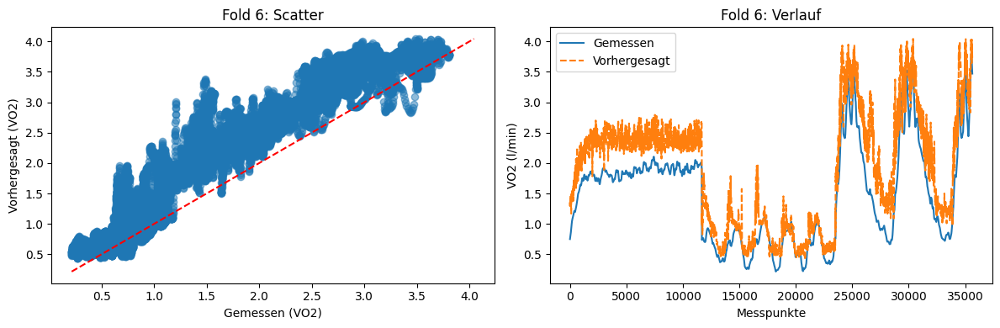


 Fold 7 – Test-Proband 7
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 76s 13ms/step - loss: 0.0171 - mae: 0.1379 - mse: 0.0342 - val_loss: 0.0217 - val_mae: 0.1703 - val_mse: 0.0434
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0124 - mae: 0.1149 - mse: 0.0248 - val_loss: 0.0196 - val_mae: 0.1547 - val_mse: 0.0391
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 84s 15ms/step - loss: 0.0108 - mae: 0.1064 - mse: 0.0217 - val_loss: 0.0229 - val_mae: 0.1700 - val_mse: 0.0457
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 82s 15ms/step - loss: 0.0087 - mae: 0.0953 - mse: 0.0174 - val_loss: 0.0232 - val_mae: 0.1713 - val_mse: 0.0465
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0080 - mae: 0.0910 - mse: 0.0160 - val_loss: 0.0256 - val_mae: 0.1810 - val_mse: 0.0512
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0074 - mae: 0.0878 - mse: 0.0148 - val_loss: 0.0228 - val_mae: 0.1706 - val_mse: 0.0456
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms

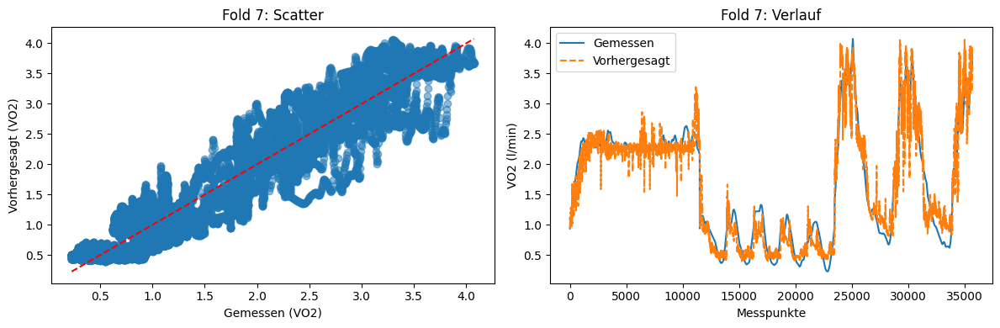


 Fold 8 – Test-Proband 8
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0136 - mae: 0.1204 - mse: 0.0271 - val_loss: 0.0228 - val_mae: 0.1762 - val_mse: 0.0457
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 72s 13ms/step - loss: 0.0096 - mae: 0.0998 - mse: 0.0193 - val_loss: 0.0252 - val_mae: 0.1870 - val_mse: 0.0503
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 72s 13ms/step - loss: 0.0082 - mae: 0.0922 - mse: 0.0164 - val_loss: 0.0254 - val_mae: 0.1873 - val_mse: 0.0509
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 72s 13ms/step - loss: 0.0064 - mae: 0.0825 - mse: 0.0129 - val_loss: 0.0288 - val_mae: 0.2010 - val_mse: 0.0577
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0060 - mae: 0.0796 - mse: 0.0121 - val_loss: 0.0274 - val_mae: 0.1964 - val_mse: 0.0548
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0058 - mae: 0.0775 - mse: 0.0115 - val_loss: 0.0258 - val_mae: 0.1888 - val_mse: 0.0516
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms

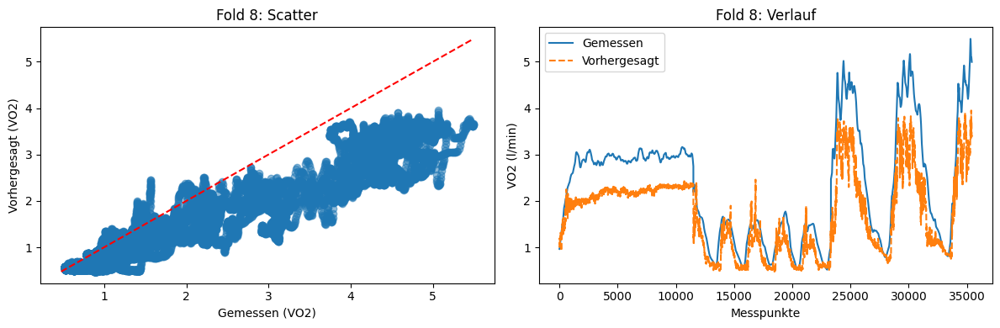


 Fold 9 – Test-Proband 9
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 75s 13ms/step - loss: 0.0162 - mae: 0.1347 - mse: 0.0324 - val_loss: 0.0198 - val_mae: 0.1606 - val_mse: 0.0396
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 72s 13ms/step - loss: 0.0120 - mae: 0.1138 - mse: 0.0239 - val_loss: 0.0206 - val_mae: 0.1588 - val_mse: 0.0413
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0101 - mae: 0.1042 - mse: 0.0202 - val_loss: 0.0225 - val_mae: 0.1688 - val_mse: 0.0450
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0085 - mae: 0.0954 - mse: 0.0169 - val_loss: 0.0245 - val_mae: 0.1757 - val_mse: 0.0490
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 76s 14ms/step - loss: 0.0078 - mae: 0.0917 - mse: 0.0157 - val_loss: 0.0214 - val_mae: 0.1659 - val_mse: 0.0428
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms/step - loss: 0.0073 - mae: 0.0879 - mse: 0.0145 - val_loss: 0.0223 - val_mae: 0.1688 - val_mse: 0.0447
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 75s 14ms

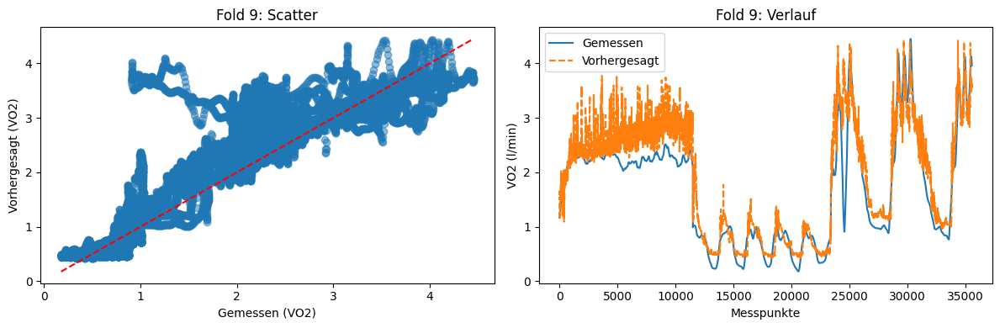


 Fold 10 – Test-Proband 10
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 75s 13ms/step - loss: 0.0160 - mae: 0.1335 - mse: 0.0320 - val_loss: 0.0202 - val_mae: 0.1557 - val_mse: 0.0403
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 72s 13ms/step - loss: 0.0116 - mae: 0.1114 - mse: 0.0231 - val_loss: 0.0230 - val_mae: 0.1616 - val_mse: 0.0460
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0102 - mae: 0.1040 - mse: 0.0204 - val_loss: 0.0203 - val_mae: 0.1529 - val_mse: 0.0406
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0084 - mae: 0.0946 - mse: 0.0168 - val_loss: 0.0229 - val_mae: 0.1678 - val_mse: 0.0458
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 78s 14ms/step - loss: 0.0079 - mae: 0.0919 - mse: 0.0158 - val_loss: 0.0230 - val_mae: 0.1639 - val_mse: 0.0459
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0075 - mae: 0.0893 - mse: 0.0150 - val_loss: 0.0219 - val_mae: 0.1614 - val_mse: 0.0437
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 71s 13

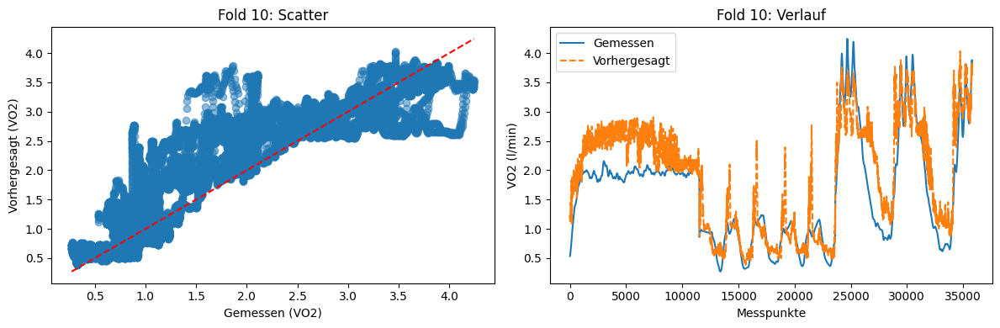


 Fold 11 – Test-Proband 11
Epoch 1/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 82s 14ms/step - loss: 0.0164 - mae: 0.1337 - mse: 0.0328 - val_loss: 0.0218 - val_mae: 0.1696 - val_mse: 0.0436
Epoch 2/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 83s 15ms/step - loss: 0.0117 - mae: 0.1091 - mse: 0.0233 - val_loss: 0.0220 - val_mae: 0.1675 - val_mse: 0.0440
Epoch 3/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 82s 15ms/step - loss: 0.0093 - mae: 0.0975 - mse: 0.0186 - val_loss: 0.0217 - val_mae: 0.1672 - val_mse: 0.0434
Epoch 4/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 80s 15ms/step - loss: 0.0085 - mae: 0.0930 - mse: 0.0170 - val_loss: 0.0261 - val_mae: 0.1847 - val_mse: 0.0522
Epoch 5/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 79s 14ms/step - loss: 0.0080 - mae: 0.0901 - mse: 0.0160 - val_loss: 0.0258 - val_mae: 0.1838 - val_mse: 0.0517
Epoch 6/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0074 - mae: 0.0871 - mse: 0.0149 - val_loss: 0.0246 - val_mae: 0.1769 - val_mse: 0.0493
Epoch 7/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 75s 14

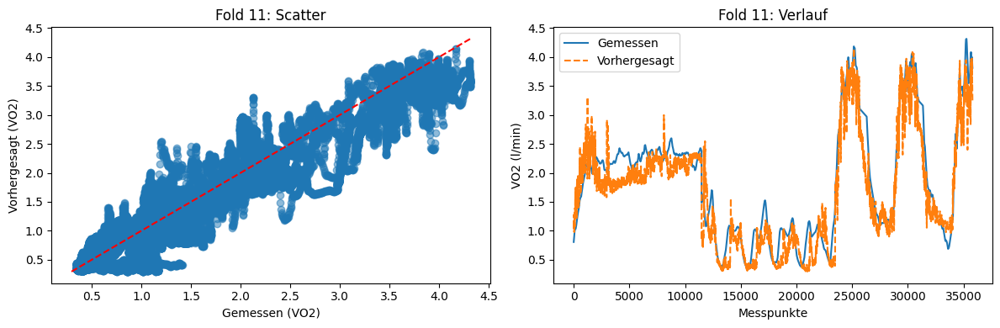


 Fold 12 – Test-Proband 12
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 77s 13ms/step - loss: 0.0171 - mae: 0.1359 - mse: 0.0343 - val_loss: 0.0147 - val_mae: 0.1306 - val_mse: 0.0295
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0118 - mae: 0.1095 - mse: 0.0235 - val_loss: 0.0128 - val_mae: 0.1230 - val_mse: 0.0256
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0104 - mae: 0.1022 - mse: 0.0208 - val_loss: 0.0103 - val_mae: 0.1119 - val_mse: 0.0205
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 77s 14ms/step - loss: 0.0089 - mae: 0.0949 - mse: 0.0178 - val_loss: 0.0126 - val_mae: 0.1244 - val_mse: 0.0251
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 73s 13ms/step - loss: 0.0081 - mae: 0.0905 - mse: 0.0162 - val_loss: 0.0110 - val_mae: 0.1166 - val_mse: 0.0219
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 74s 13ms/step - loss: 0.0076 - mae: 0.0880 - mse: 0.0153 - val_loss: 0.0112 - val_mae: 0.1190 - val_mse: 0.0223
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 75s 14

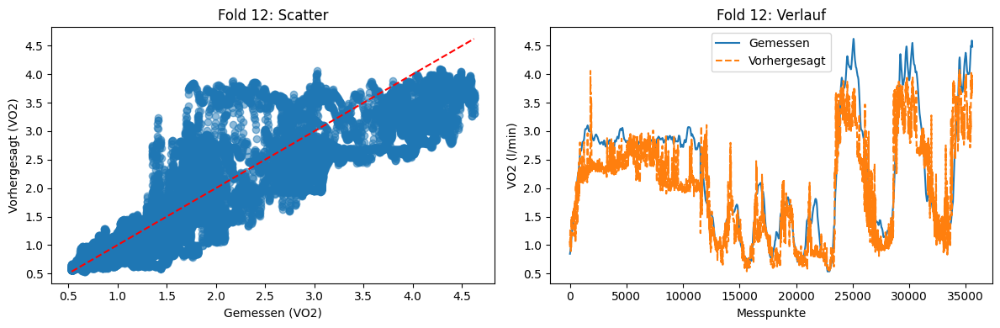


Durchschnitt über alle Folds:
 RMSE: 0.49
 R2 (Fold-Mittel): 0.72
 MAPE: 26.99%
 R2 (gesamt): 0.75


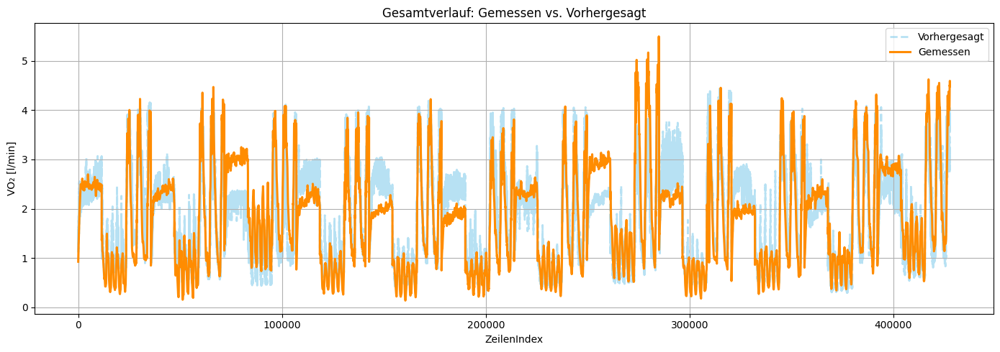

<Figure size 640x480 with 0 Axes>

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

for spalte in wichtige_spalten:
    gruppiert = df.groupby(["Proband", "TestArt"])[spalte]
    df[f"{spalte}_verzoegerung{verzögert}"] = gruppiert.shift(verzögert)
    df[f"{spalte}_differenz{delta}"] = gruppiert.diff(delta)
    df[f"{spalte}_mittelwert{roll}"] = gruppiert.transform(lambda x: x.rolling(roll, min_periods=1).mean())

df["HR_Pmet_interaktion"] = df["HR"] * df["Pmet (W/kg)"]
df["speed_acc_interaktion"] = df["speed (m/s)"] * df["acc (m/s2)"]

# Relative Zeit
df["rel_zeit"] = df.groupby(["Proband", "TestArt"])["time (MPM)"].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "original_sim oxygen uptake (l/min)", "Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values


fenster = 15  

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str) 

for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name)  

    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])       
            y_seq_liste.append(y_gruppe[i + fenster])           
            gruppen_liste.append(gruppen_gruppe[i + fenster])   

X_seq = np.array(X_seq_liste, dtype="float32")    
y_seq = np.array(y_seq_liste, dtype="float32")   
gruppen_seq = np.array(gruppen_liste)             


def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):
    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s

def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()

Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), LSTM(64, return_sequences=True, activation="tanh"), LSTM(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    # Plots
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
print("\nDurchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")

color_true = "darkorange"
color_pred = "skyblue"

plt.figure(figsize=(14, 5))
plt.plot(alle_vorhersagen, "--", label="Vorhergesagt", linewidth=2.0, color=color_pred, alpha=0.6, zorder=1)  
plt.plot(alle_istwerte, label="Gemessen", linewidth=2.2, color=color_true, alpha=1.0, zorder=2) 
plt.xlabel("ZeilenIndex")
plt.ylabel("VO₂ [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()

plt.savefig("LSTM_mit_Feat.png", dpi=300, bbox_inches='tight')

#GRU ohne Feature Engeneering (ohne Original Smulierten VO₂ Werte)


 Fold 1 – Test-Proband 1
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0187 - mae: 0.1457 - mse: 0.0373 - val_loss: 0.0194 - val_mae: 0.1600 - val_mse: 0.0388
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 38s 7ms/step - loss: 0.0154 - mae: 0.1310 - mse: 0.0309 - val_loss: 0.0180 - val_mae: 0.1558 - val_mse: 0.0359
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 38s 7ms/step - loss: 0.0149 - mae: 0.1282 - mse: 0.0298 - val_loss: 0.0192 - val_mae: 0.1615 - val_mse: 0.0384
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 38s 7ms/step - loss: 0.0146 - mae: 0.1263 - mse: 0.0291 - val_loss: 0.0182 - val_mae: 0.1562 - val_mse: 0.0364
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0143 - mae: 0.1249 - mse: 0.0286 - val_loss: 0.0196 - val_mae: 0.1633 - val_mse: 0.0392
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0141 - mae: 0.1237 - mse: 0.0281 - val_loss: 0.0216 - val_mae: 0.1681 - val_mse: 0.0432
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

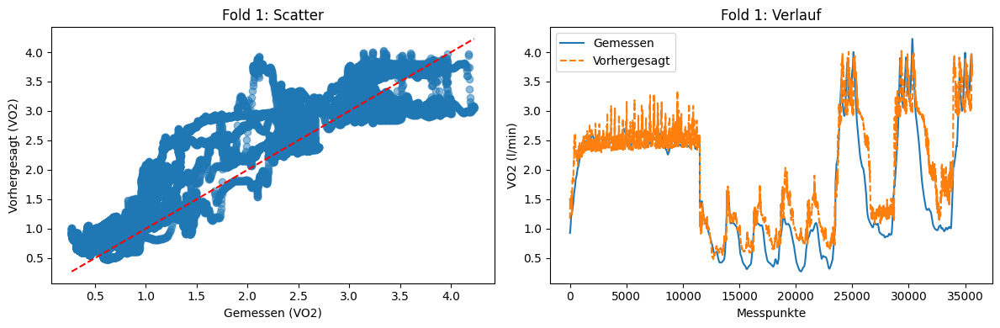


 Fold 2 – Test-Proband 2
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 41s 7ms/step - loss: 0.0195 - mae: 0.1473 - mse: 0.0389 - val_loss: 0.0180 - val_mae: 0.1567 - val_mse: 0.0360
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0155 - mae: 0.1313 - mse: 0.0311 - val_loss: 0.0178 - val_mae: 0.1565 - val_mse: 0.0355
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0149 - mae: 0.1281 - mse: 0.0298 - val_loss: 0.0189 - val_mae: 0.1586 - val_mse: 0.0377
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0146 - mae: 0.1263 - mse: 0.0292 - val_loss: 0.0182 - val_mae: 0.1560 - val_mse: 0.0364
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0144 - mae: 0.1253 - mse: 0.0289 - val_loss: 0.0170 - val_mae: 0.1500 - val_mse: 0.0340
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0142 - mae: 0.1237 - mse: 0.0284 - val_loss: 0.0235 - val_mae: 0.1775 - val_mse: 0.0470
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

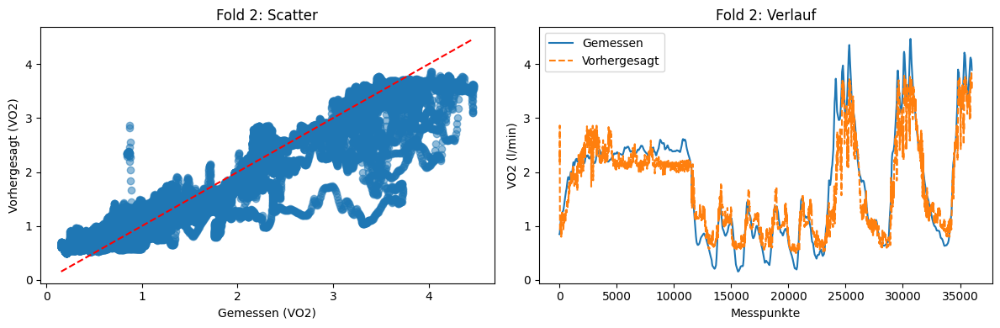


 Fold 3 – Test-Proband 3
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0157 - mae: 0.1299 - mse: 0.0313 - val_loss: 0.0172 - val_mae: 0.1517 - val_mse: 0.0343
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0124 - mae: 0.1144 - mse: 0.0248 - val_loss: 0.0216 - val_mae: 0.1720 - val_mse: 0.0432
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0119 - mae: 0.1113 - mse: 0.0239 - val_loss: 0.0183 - val_mae: 0.1560 - val_mse: 0.0367
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0115 - mae: 0.1083 - mse: 0.0230 - val_loss: 0.0186 - val_mae: 0.1534 - val_mse: 0.0371
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0112 - mae: 0.1071 - mse: 0.0225 - val_loss: 0.0181 - val_mae: 0.1549 - val_mse: 0.0363
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0111 - mae: 0.1063 - mse: 0.0223 - val_loss: 0.0191 - val_mae: 0.1587 - val_mse: 0.0382
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

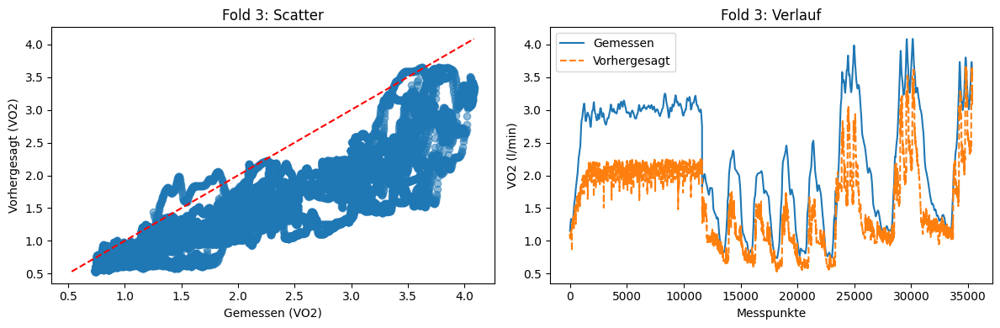


 Fold 4 – Test-Proband 4
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0183 - mae: 0.1437 - mse: 0.0366 - val_loss: 0.0153 - val_mae: 0.1425 - val_mse: 0.0307
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0152 - mae: 0.1294 - mse: 0.0305 - val_loss: 0.0146 - val_mae: 0.1362 - val_mse: 0.0293
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0146 - mae: 0.1264 - mse: 0.0293 - val_loss: 0.0154 - val_mae: 0.1380 - val_mse: 0.0309
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0143 - mae: 0.1244 - mse: 0.0286 - val_loss: 0.0165 - val_mae: 0.1413 - val_mse: 0.0331
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0142 - mae: 0.1236 - mse: 0.0284 - val_loss: 0.0142 - val_mae: 0.1306 - val_mse: 0.0284
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0141 - mae: 0.1230 - mse: 0.0282 - val_loss: 0.0156 - val_mae: 0.1383 - val_mse: 0.0311
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

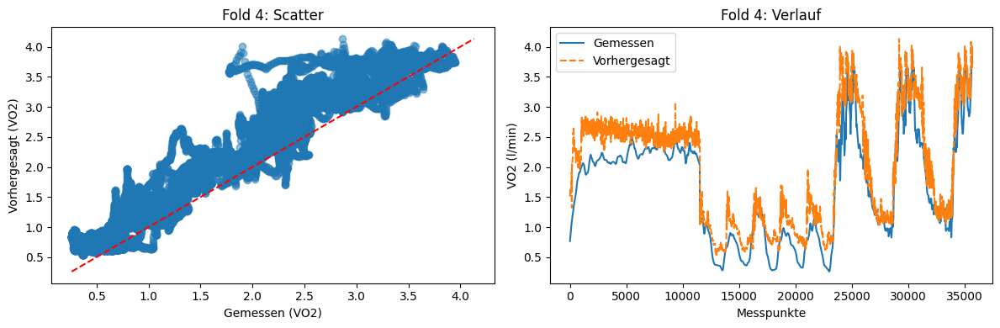


 Fold 5 – Test-Proband 5
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0203 - mae: 0.1514 - mse: 0.0406 - val_loss: 0.0201 - val_mae: 0.1619 - val_mse: 0.0402
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0157 - mae: 0.1310 - mse: 0.0313 - val_loss: 0.0206 - val_mae: 0.1685 - val_mse: 0.0412
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0153 - mae: 0.1291 - mse: 0.0306 - val_loss: 0.0171 - val_mae: 0.1488 - val_mse: 0.0342
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0149 - mae: 0.1273 - mse: 0.0298 - val_loss: 0.0191 - val_mae: 0.1602 - val_mse: 0.0381
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0147 - mae: 0.1258 - mse: 0.0294 - val_loss: 0.0222 - val_mae: 0.1710 - val_mse: 0.0444
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0145 - mae: 0.1248 - mse: 0.0291 - val_loss: 0.0225 - val_mae: 0.1710 - val_mse: 0.0451
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

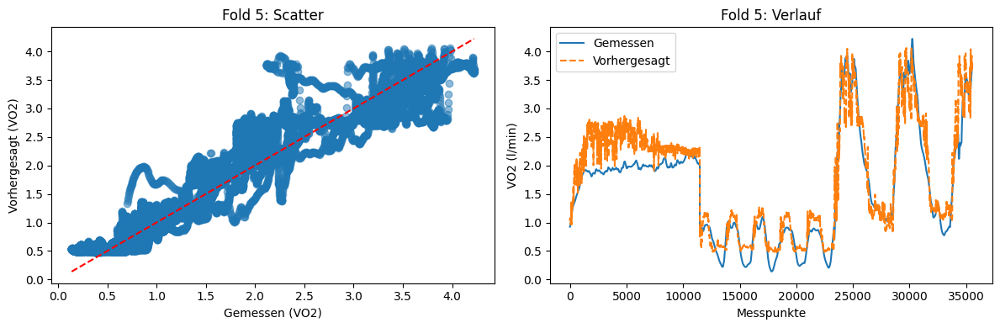


 Fold 6 – Test-Proband 6
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0179 - mae: 0.1406 - mse: 0.0358 - val_loss: 0.0178 - val_mae: 0.1567 - val_mse: 0.0357
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0144 - mae: 0.1252 - mse: 0.0289 - val_loss: 0.0210 - val_mae: 0.1685 - val_mse: 0.0419
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0140 - mae: 0.1226 - mse: 0.0280 - val_loss: 0.0174 - val_mae: 0.1525 - val_mse: 0.0347
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0138 - mae: 0.1215 - mse: 0.0275 - val_loss: 0.0185 - val_mae: 0.1568 - val_mse: 0.0370
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0136 - mae: 0.1205 - mse: 0.0271 - val_loss: 0.0221 - val_mae: 0.1711 - val_mse: 0.0442
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0133 - mae: 0.1192 - mse: 0.0267 - val_loss: 0.0200 - val_mae: 0.1618 - val_mse: 0.0401
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

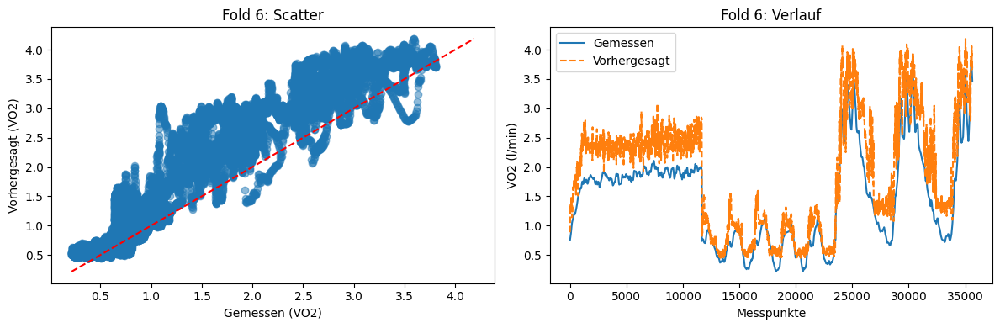


 Fold 7 – Test-Proband 7
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0192 - mae: 0.1473 - mse: 0.0383 - val_loss: 0.0166 - val_mae: 0.1496 - val_mse: 0.0333
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0159 - mae: 0.1335 - mse: 0.0319 - val_loss: 0.0186 - val_mae: 0.1574 - val_mse: 0.0371
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0153 - mae: 0.1305 - mse: 0.0307 - val_loss: 0.0186 - val_mae: 0.1578 - val_mse: 0.0371
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0149 - mae: 0.1279 - mse: 0.0298 - val_loss: 0.0190 - val_mae: 0.1594 - val_mse: 0.0380
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0147 - mae: 0.1267 - mse: 0.0295 - val_loss: 0.0183 - val_mae: 0.1555 - val_mse: 0.0365
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0145 - mae: 0.1253 - mse: 0.0289 - val_loss: 0.0183 - val_mae: 0.1561 - val_mse: 0.0366
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

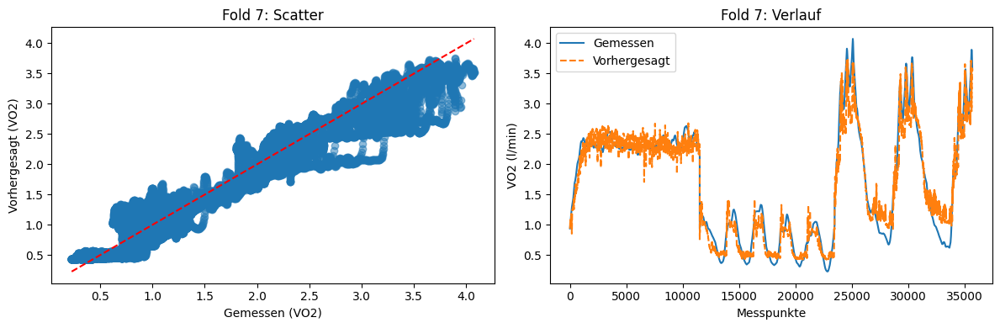


 Fold 8 – Test-Proband 8
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0164 - mae: 0.1338 - mse: 0.0328 - val_loss: 0.0256 - val_mae: 0.1895 - val_mse: 0.0511
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0122 - mae: 0.1145 - mse: 0.0245 - val_loss: 0.0227 - val_mae: 0.1764 - val_mse: 0.0454
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0119 - mae: 0.1126 - mse: 0.0238 - val_loss: 0.0217 - val_mae: 0.1749 - val_mse: 0.0435
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0116 - mae: 0.1105 - mse: 0.0232 - val_loss: 0.0218 - val_mae: 0.1715 - val_mse: 0.0436
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0114 - mae: 0.1094 - mse: 0.0228 - val_loss: 0.0236 - val_mae: 0.1798 - val_mse: 0.0473
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0112 - mae: 0.1082 - mse: 0.0224 - val_loss: 0.0258 - val_mae: 0.1887 - val_mse: 0.0516
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

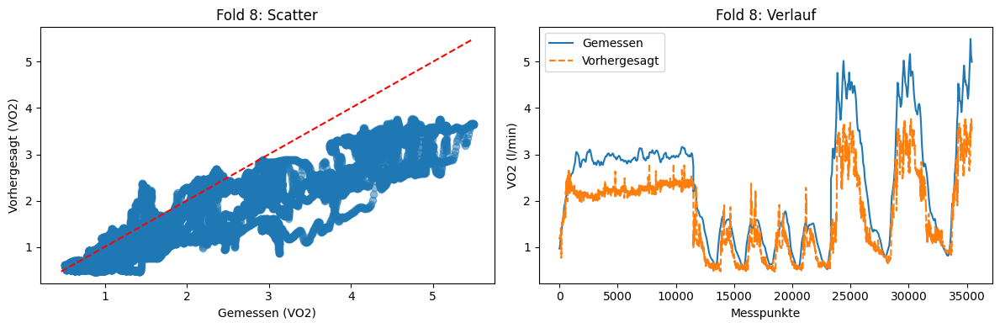


 Fold 9 – Test-Proband 9
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0186 - mae: 0.1457 - mse: 0.0373 - val_loss: 0.0185 - val_mae: 0.1553 - val_mse: 0.0369
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0152 - mae: 0.1303 - mse: 0.0304 - val_loss: 0.0211 - val_mae: 0.1672 - val_mse: 0.0422
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0147 - mae: 0.1284 - mse: 0.0295 - val_loss: 0.0180 - val_mae: 0.1524 - val_mse: 0.0360
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0144 - mae: 0.1269 - mse: 0.0288 - val_loss: 0.0205 - val_mae: 0.1634 - val_mse: 0.0410
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0141 - mae: 0.1256 - mse: 0.0283 - val_loss: 0.0176 - val_mae: 0.1515 - val_mse: 0.0351
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0140 - mae: 0.1247 - mse: 0.0280 - val_loss: 0.0196 - val_mae: 0.1601 - val_mse: 0.0393
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

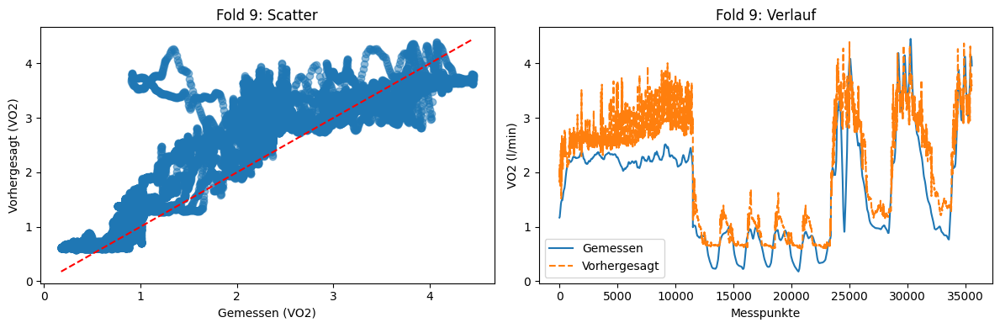


 Fold 10 – Test-Proband 10
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0178 - mae: 0.1419 - mse: 0.0357 - val_loss: 0.0153 - val_mae: 0.1410 - val_mse: 0.0305
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0149 - mae: 0.1289 - mse: 0.0298 - val_loss: 0.0158 - val_mae: 0.1435 - val_mse: 0.0315
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0143 - mae: 0.1262 - mse: 0.0286 - val_loss: 0.0150 - val_mae: 0.1408 - val_mse: 0.0299
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0139 - mae: 0.1241 - mse: 0.0278 - val_loss: 0.0156 - val_mae: 0.1391 - val_mse: 0.0312
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0138 - mae: 0.1233 - mse: 0.0276 - val_loss: 0.0188 - val_mae: 0.1507 - val_mse: 0.0375
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0135 - mae: 0.1221 - mse: 0.0270 - val_loss: 0.0146 - val_mae: 0.1356 - val_mse: 0.0293
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step

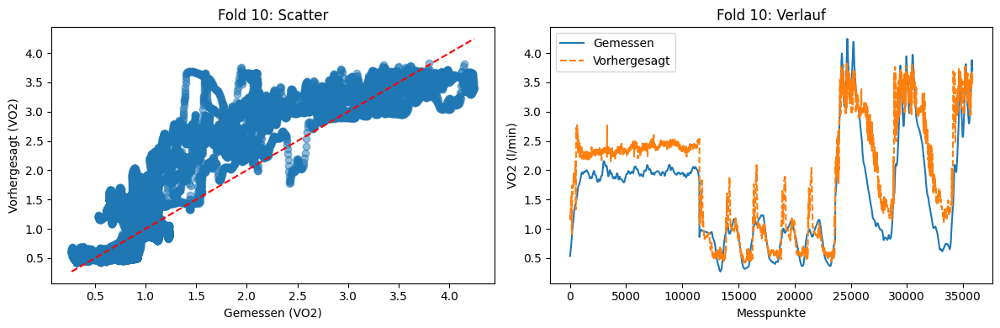


 Fold 11 – Test-Proband 11
Epoch 1/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0182 - mae: 0.1430 - mse: 0.0365 - val_loss: 0.0200 - val_mae: 0.1683 - val_mse: 0.0400
Epoch 2/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0152 - mae: 0.1283 - mse: 0.0304 - val_loss: 0.0199 - val_mae: 0.1681 - val_mse: 0.0397
Epoch 3/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0147 - mae: 0.1262 - mse: 0.0295 - val_loss: 0.0213 - val_mae: 0.1718 - val_mse: 0.0426
Epoch 4/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0144 - mae: 0.1241 - mse: 0.0288 - val_loss: 0.0205 - val_mae: 0.1679 - val_mse: 0.0410
Epoch 5/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0142 - mae: 0.1229 - mse: 0.0283 - val_loss: 0.0205 - val_mae: 0.1664 - val_mse: 0.0411
Epoch 6/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0139 - mae: 0.1215 - mse: 0.0279 - val_loss: 0.0214 - val_mae: 0.1682 - val_mse: 0.0428
Epoch 7/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step

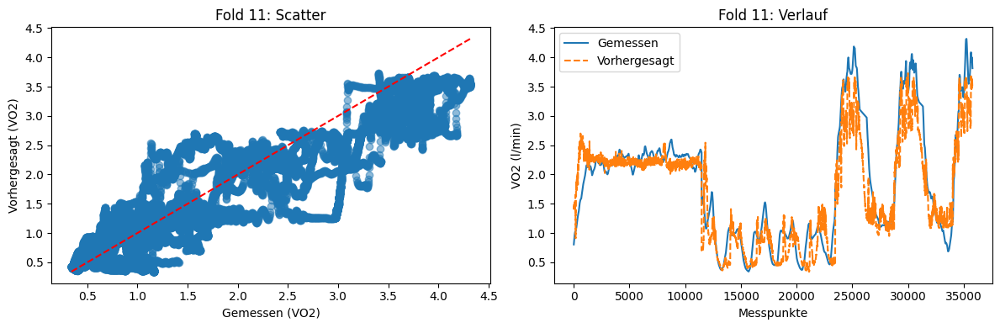


 Fold 12 – Test-Proband 12
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0190 - mae: 0.1451 - mse: 0.0380 - val_loss: 0.0170 - val_mae: 0.1416 - val_mse: 0.0339
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0149 - mae: 0.1271 - mse: 0.0298 - val_loss: 0.0144 - val_mae: 0.1243 - val_mse: 0.0288
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0145 - mae: 0.1253 - mse: 0.0289 - val_loss: 0.0157 - val_mae: 0.1278 - val_mse: 0.0313
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0139 - mae: 0.1223 - mse: 0.0278 - val_loss: 0.0160 - val_mae: 0.1275 - val_mse: 0.0319
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0136 - mae: 0.1203 - mse: 0.0271 - val_loss: 0.0159 - val_mae: 0.1300 - val_mse: 0.0318
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0134 - mae: 0.1194 - mse: 0.0268 - val_loss: 0.0147 - val_mae: 0.1254 - val_mse: 0.0294
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step

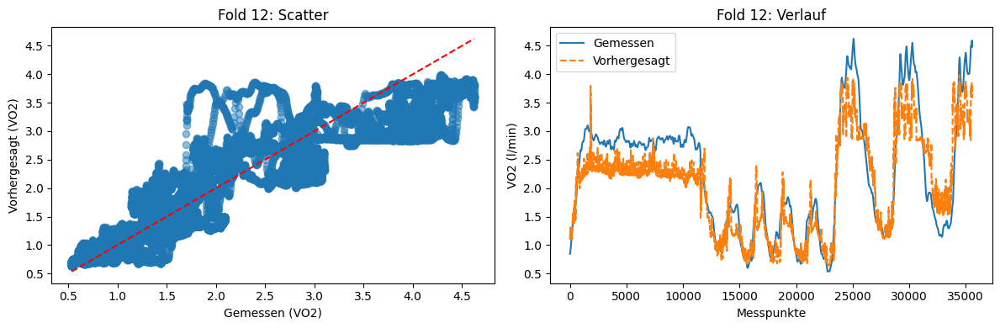


Durchschnitt über alle Folds:
 RMSE: 0.49
 R2 (Fold-Mittel): 0.71
 MAPE: 27.48%
 R2 (gesamt): 0.74


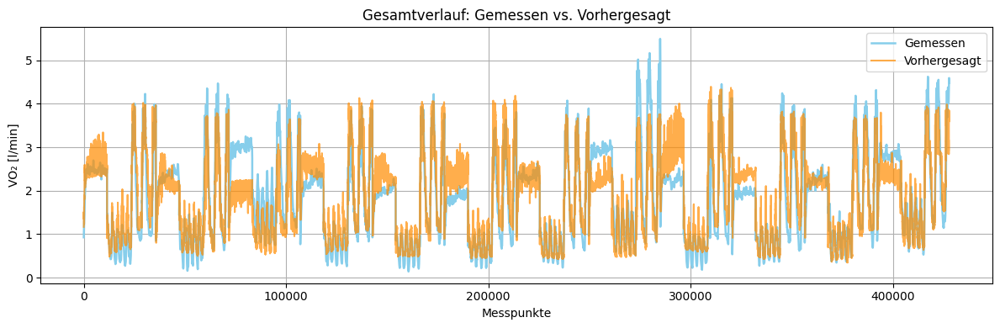

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "original_sim oxygen uptake (l/min)" ,"Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values

fenster = 15 

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str) 

for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name) 

    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])       
            y_seq_liste.append(y_gruppe[i + fenster])           
            gruppen_liste.append(gruppen_gruppe[i + fenster])   

X_seq = np.array(X_seq_liste, dtype="float32")    
y_seq = np.array(y_seq_liste, dtype="float32")    
gruppen_seq = np.array(gruppen_liste)           



def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):
    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s

def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()

Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), GRU(64, return_sequences=True, activation="tanh"), GRU(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    # Plots
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
print("\nDurchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")

plt.figure(figsize=(12, 4))
plt.plot(alle_istwerte, label="Gemessen", linewidth=1.8, color="skyblue")
plt.plot(alle_vorhersagen, label="Vorhergesagt", alpha=0.7, color="darkorange")
plt.xlabel("Messpunkte")
plt.ylabel("VO₂ [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#GRU mit Feature Engeneering (ohne Original Smulierten VO₂ Werte)


 Fold 1 – Test-Proband 1
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0176 - mae: 0.1407 - mse: 0.0352 - val_loss: 0.0197 - val_mae: 0.1630 - val_mse: 0.0394
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0132 - mae: 0.1199 - mse: 0.0264 - val_loss: 0.0195 - val_mae: 0.1542 - val_mse: 0.0390
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0119 - mae: 0.1122 - mse: 0.0238 - val_loss: 0.0230 - val_mae: 0.1675 - val_mse: 0.0461
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0105 - mae: 0.1053 - mse: 0.0210 - val_loss: 0.0215 - val_mae: 0.1644 - val_mse: 0.0431
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0089 - mae: 0.0967 - mse: 0.0177 - val_loss: 0.0250 - val_mae: 0.1772 - val_mse: 0.0501
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0085 - mae: 0.0945 - mse: 0.0169 - val_loss: 0.0254 - val_mae: 0.1790 - val_mse: 0.0507
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

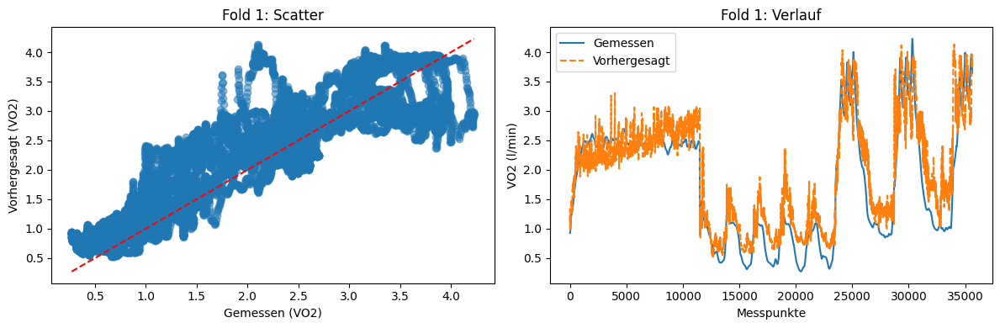


 Fold 2 – Test-Proband 2
Epoch 1/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0180 - mae: 0.1415 - mse: 0.0360 - val_loss: 0.0187 - val_mae: 0.1572 - val_mse: 0.0373
Epoch 2/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0137 - mae: 0.1228 - mse: 0.0274 - val_loss: 0.0197 - val_mae: 0.1605 - val_mse: 0.0394
Epoch 3/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0122 - mae: 0.1149 - mse: 0.0245 - val_loss: 0.0236 - val_mae: 0.1742 - val_mse: 0.0471
Epoch 4/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0108 - mae: 0.1072 - mse: 0.0217 - val_loss: 0.0232 - val_mae: 0.1712 - val_mse: 0.0465
Epoch 5/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0100 - mae: 0.1027 - mse: 0.0200 - val_loss: 0.0191 - val_mae: 0.1515 - val_mse: 0.0382
Epoch 6/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0091 - mae: 0.0978 - mse: 0.0181 - val_loss: 0.0228 - val_mae: 0.1725 - val_mse: 0.0455
Epoch 7/30
5509/5509 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

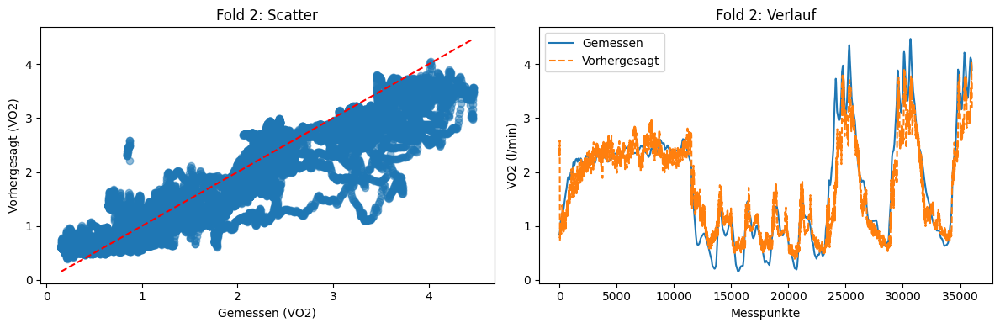


 Fold 3 – Test-Proband 3
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0147 - mae: 0.1256 - mse: 0.0294 - val_loss: 0.0157 - val_mae: 0.1428 - val_mse: 0.0314
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0110 - mae: 0.1074 - mse: 0.0221 - val_loss: 0.0190 - val_mae: 0.1547 - val_mse: 0.0381
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0100 - mae: 0.1010 - mse: 0.0200 - val_loss: 0.0239 - val_mae: 0.1764 - val_mse: 0.0477
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0093 - mae: 0.0967 - mse: 0.0187 - val_loss: 0.0219 - val_mae: 0.1691 - val_mse: 0.0438
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0088 - mae: 0.0942 - mse: 0.0177 - val_loss: 0.0222 - val_mae: 0.1682 - val_mse: 0.0443
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0082 - mae: 0.0908 - mse: 0.0164 - val_loss: 0.0237 - val_mae: 0.1760 - val_mse: 0.0474
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

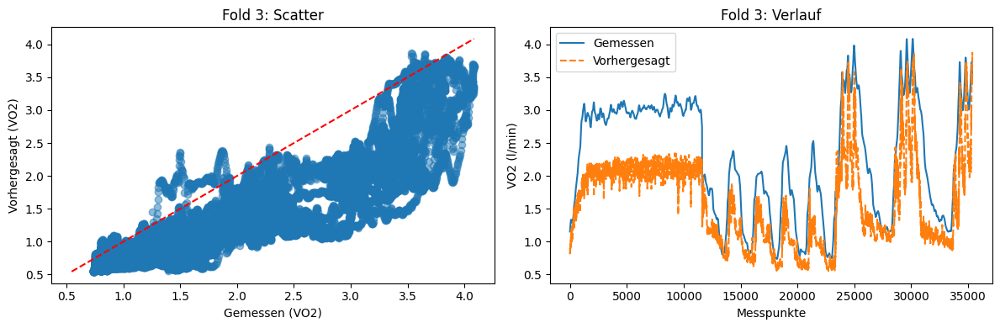


 Fold 4 – Test-Proband 4
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0174 - mae: 0.1401 - mse: 0.0349 - val_loss: 0.0156 - val_mae: 0.1438 - val_mse: 0.0312
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0133 - mae: 0.1213 - mse: 0.0267 - val_loss: 0.0173 - val_mae: 0.1439 - val_mse: 0.0347
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0120 - mae: 0.1129 - mse: 0.0240 - val_loss: 0.0183 - val_mae: 0.1457 - val_mse: 0.0365
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0106 - mae: 0.1056 - mse: 0.0212 - val_loss: 0.0189 - val_mae: 0.1528 - val_mse: 0.0378
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0097 - mae: 0.1004 - mse: 0.0193 - val_loss: 0.0187 - val_mae: 0.1514 - val_mse: 0.0375
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0087 - mae: 0.0955 - mse: 0.0175 - val_loss: 0.0208 - val_mae: 0.1601 - val_mse: 0.0417
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step -

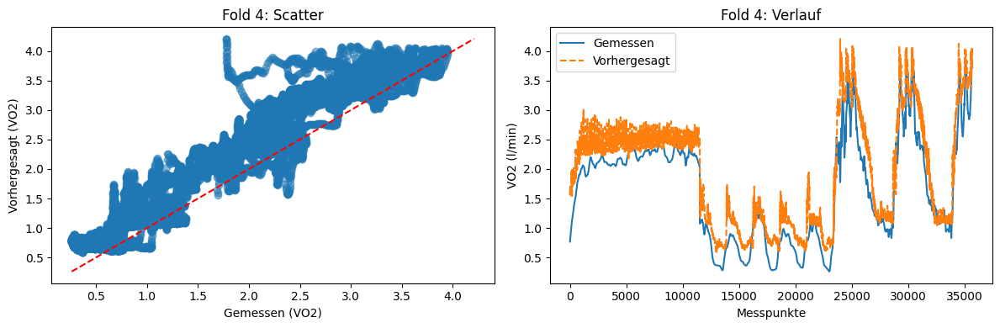


 Fold 5 – Test-Proband 5
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0182 - mae: 0.1434 - mse: 0.0365 - val_loss: 0.0218 - val_mae: 0.1709 - val_mse: 0.0435
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0134 - mae: 0.1212 - mse: 0.0269 - val_loss: 0.0208 - val_mae: 0.1627 - val_mse: 0.0417
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0119 - mae: 0.1130 - mse: 0.0238 - val_loss: 0.0228 - val_mae: 0.1679 - val_mse: 0.0456
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0105 - mae: 0.1049 - mse: 0.0209 - val_loss: 0.0218 - val_mae: 0.1651 - val_mse: 0.0435
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0092 - mae: 0.0985 - mse: 0.0184 - val_loss: 0.0247 - val_mae: 0.1780 - val_mse: 0.0494
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0087 - mae: 0.0956 - mse: 0.0174 - val_loss: 0.0267 - val_mae: 0.1866 - val_mse: 0.0534
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

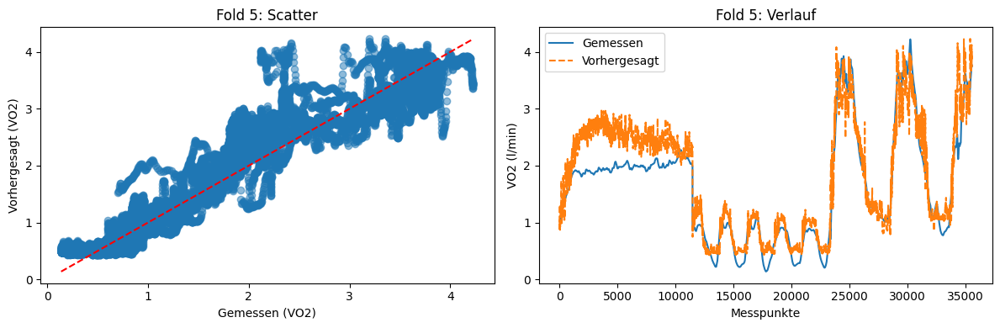


 Fold 6 – Test-Proband 6
Epoch 1/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0168 - mae: 0.1362 - mse: 0.0335 - val_loss: 0.0168 - val_mae: 0.1497 - val_mse: 0.0336
Epoch 2/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0128 - mae: 0.1179 - mse: 0.0257 - val_loss: 0.0186 - val_mae: 0.1540 - val_mse: 0.0373
Epoch 3/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0117 - mae: 0.1118 - mse: 0.0235 - val_loss: 0.0198 - val_mae: 0.1565 - val_mse: 0.0396
Epoch 4/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0108 - mae: 0.1069 - mse: 0.0215 - val_loss: 0.0208 - val_mae: 0.1617 - val_mse: 0.0417
Epoch 5/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0091 - mae: 0.0984 - mse: 0.0182 - val_loss: 0.0207 - val_mae: 0.1603 - val_mse: 0.0414
Epoch 6/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0085 - mae: 0.0951 - mse: 0.0171 - val_loss: 0.0215 - val_mae: 0.1670 - val_mse: 0.0430
Epoch 7/30
5515/5515 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

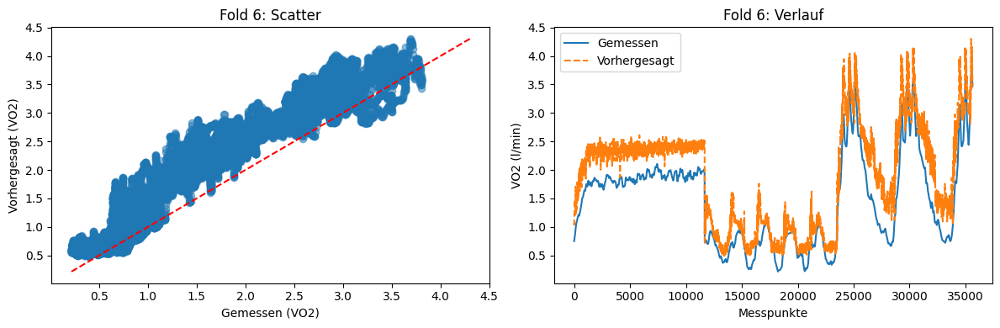


 Fold 7 – Test-Proband 7
Epoch 1/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0189 - mae: 0.1454 - mse: 0.0379 - val_loss: 0.0169 - val_mae: 0.1520 - val_mse: 0.0338
Epoch 2/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0139 - mae: 0.1242 - mse: 0.0277 - val_loss: 0.0170 - val_mae: 0.1491 - val_mse: 0.0340
Epoch 3/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0126 - mae: 0.1166 - mse: 0.0251 - val_loss: 0.0217 - val_mae: 0.1653 - val_mse: 0.0435
Epoch 4/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0113 - mae: 0.1098 - mse: 0.0227 - val_loss: 0.0221 - val_mae: 0.1699 - val_mse: 0.0443
Epoch 5/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0096 - mae: 0.1014 - mse: 0.0192 - val_loss: 0.0227 - val_mae: 0.1710 - val_mse: 0.0453
Epoch 6/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0088 - mae: 0.0966 - mse: 0.0175 - val_loss: 0.0210 - val_mae: 0.1622 - val_mse: 0.0421
Epoch 7/30
5514/5514 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

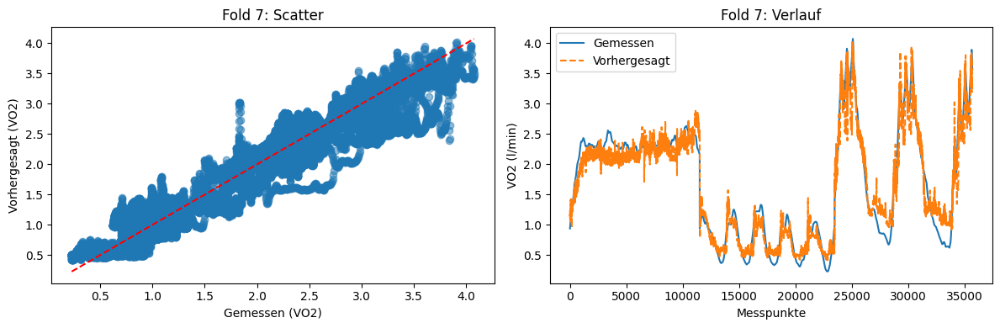


 Fold 8 – Test-Proband 8
Epoch 1/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0158 - mae: 0.1301 - mse: 0.0315 - val_loss: 0.0201 - val_mae: 0.1665 - val_mse: 0.0402
Epoch 2/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0104 - mae: 0.1055 - mse: 0.0209 - val_loss: 0.0239 - val_mae: 0.1828 - val_mse: 0.0478
Epoch 3/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0095 - mae: 0.1006 - mse: 0.0191 - val_loss: 0.0280 - val_mae: 0.1962 - val_mse: 0.0561
Epoch 4/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0085 - mae: 0.0951 - mse: 0.0170 - val_loss: 0.0252 - val_mae: 0.1852 - val_mse: 0.0505
Epoch 5/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 39s 7ms/step - loss: 0.0080 - mae: 0.0919 - mse: 0.0160 - val_loss: 0.0276 - val_mae: 0.1944 - val_mse: 0.0552
Epoch 6/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0074 - mae: 0.0886 - mse: 0.0148 - val_loss: 0.0278 - val_mae: 0.1939 - val_mse: 0.0557
Epoch 7/30
5518/5518 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

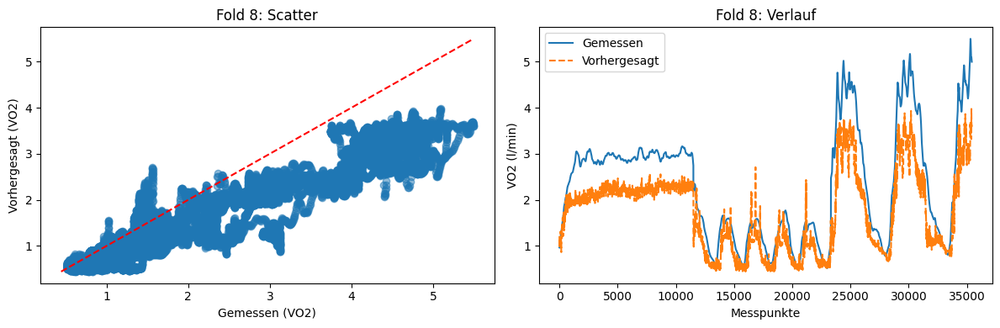


 Fold 9 – Test-Proband 9
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 42s 7ms/step - loss: 0.0176 - mae: 0.1412 - mse: 0.0352 - val_loss: 0.0195 - val_mae: 0.1594 - val_mse: 0.0389
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0133 - mae: 0.1224 - mse: 0.0266 - val_loss: 0.0210 - val_mae: 0.1667 - val_mse: 0.0419
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0123 - mae: 0.1176 - mse: 0.0246 - val_loss: 0.0203 - val_mae: 0.1606 - val_mse: 0.0406
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0108 - mae: 0.1102 - mse: 0.0216 - val_loss: 0.0214 - val_mae: 0.1617 - val_mse: 0.0429
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0100 - mae: 0.1047 - mse: 0.0201 - val_loss: 0.0215 - val_mae: 0.1618 - val_mse: 0.0431
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0090 - mae: 0.0990 - mse: 0.0180 - val_loss: 0.0234 - val_mae: 0.1699 - val_mse: 0.0469
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step -

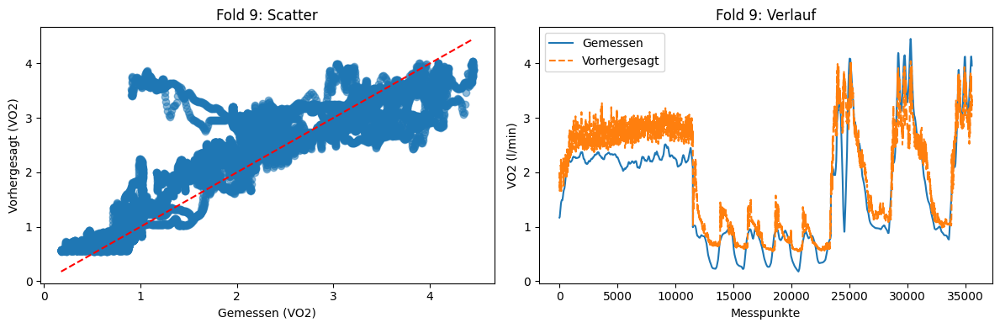


 Fold 10 – Test-Proband 10
Epoch 1/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 44s 7ms/step - loss: 0.0167 - mae: 0.1370 - mse: 0.0333 - val_loss: 0.0186 - val_mae: 0.1565 - val_mse: 0.0371
Epoch 2/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0127 - mae: 0.1190 - mse: 0.0254 - val_loss: 0.0184 - val_mae: 0.1487 - val_mse: 0.0368
Epoch 3/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0114 - mae: 0.1111 - mse: 0.0228 - val_loss: 0.0213 - val_mae: 0.1600 - val_mse: 0.0425
Epoch 4/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0109 - mae: 0.1077 - mse: 0.0218 - val_loss: 0.0225 - val_mae: 0.1599 - val_mse: 0.0450
Epoch 5/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0103 - mae: 0.1047 - mse: 0.0206 - val_loss: 0.0213 - val_mae: 0.1566 - val_mse: 0.0427
Epoch 6/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0097 - mae: 0.1013 - mse: 0.0195 - val_loss: 0.0212 - val_mae: 0.1559 - val_mse: 0.0423
Epoch 7/30
5512/5512 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step

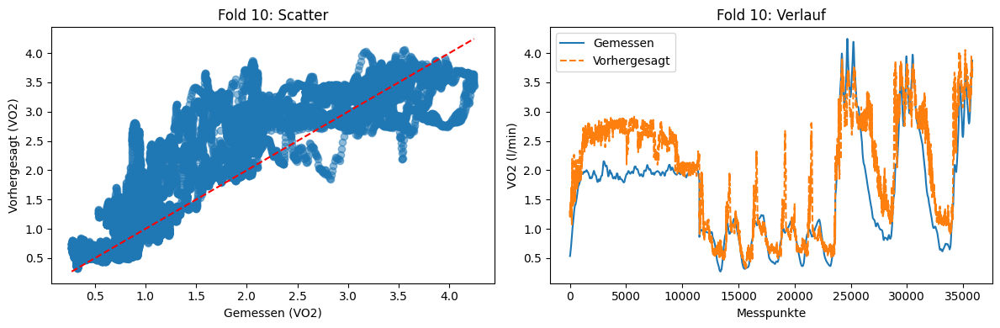


 Fold 11 – Test-Proband 11
Epoch 1/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0175 - mae: 0.1394 - mse: 0.0350 - val_loss: 0.0205 - val_mae: 0.1687 - val_mse: 0.0410
Epoch 2/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0136 - mae: 0.1209 - mse: 0.0272 - val_loss: 0.0260 - val_mae: 0.1852 - val_mse: 0.0521
Epoch 3/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0119 - mae: 0.1119 - mse: 0.0239 - val_loss: 0.0210 - val_mae: 0.1675 - val_mse: 0.0421
Epoch 4/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0107 - mae: 0.1053 - mse: 0.0215 - val_loss: 0.0259 - val_mae: 0.1835 - val_mse: 0.0518
Epoch 5/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0095 - mae: 0.0994 - mse: 0.0191 - val_loss: 0.0212 - val_mae: 0.1659 - val_mse: 0.0424
Epoch 6/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0089 - mae: 0.0956 - mse: 0.0177 - val_loss: 0.0244 - val_mae: 0.1780 - val_mse: 0.0489
Epoch 7/30
5513/5513 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step

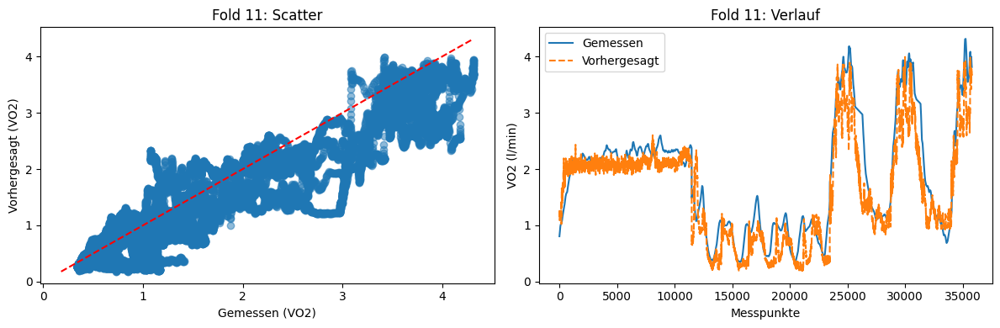


 Fold 12 – Test-Proband 12
Epoch 1/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 43s 7ms/step - loss: 0.0179 - mae: 0.1392 - mse: 0.0359 - val_loss: 0.0165 - val_mae: 0.1395 - val_mse: 0.0331
Epoch 2/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0129 - mae: 0.1175 - mse: 0.0258 - val_loss: 0.0133 - val_mae: 0.1253 - val_mse: 0.0266
Epoch 3/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0119 - mae: 0.1110 - mse: 0.0237 - val_loss: 0.0116 - val_mae: 0.1168 - val_mse: 0.0233
Epoch 4/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0106 - mae: 0.1043 - mse: 0.0211 - val_loss: 0.0102 - val_mae: 0.1124 - val_mse: 0.0205
Epoch 5/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0092 - mae: 0.0973 - mse: 0.0183 - val_loss: 0.0084 - val_mae: 0.1023 - val_mse: 0.0168
Epoch 6/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step - loss: 0.0086 - mae: 0.0943 - mse: 0.0172 - val_loss: 0.0096 - val_mae: 0.1066 - val_mse: 0.0192
Epoch 7/30
5516/5516 ━━━━━━━━━━━━━━━━━━━━ 40s 7ms/step

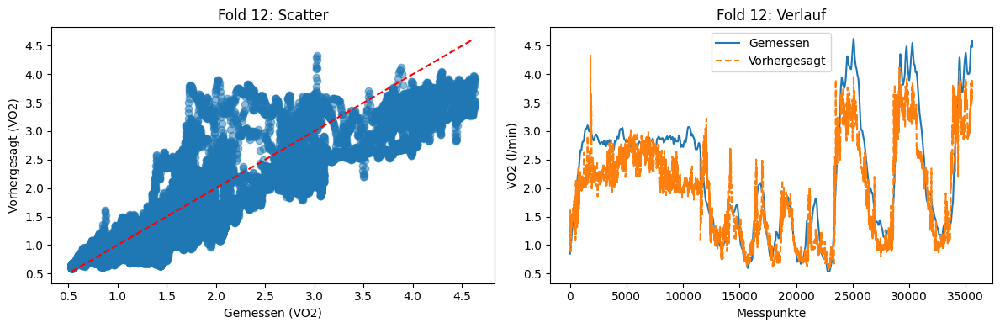


Durchschnitt über alle Folds:
 RMSE: 0.50
 R2 (Fold-Mittel): 0.71
 MAPE: 27.53%
 R2 (gesamt): 0.74


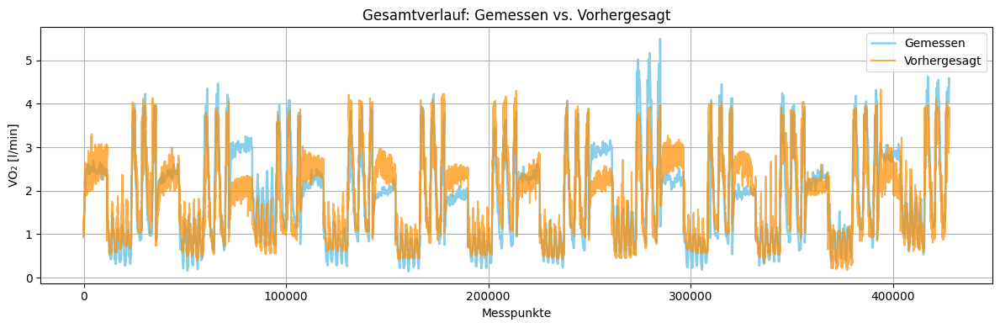

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.preprocessing import RobustScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, GRU, Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import os

# Reproduzierbarkeit
SEED = 0
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)


df = pd.read_csv("DatasetIndex.csv")
df = df.sort_values(["Proband", "TestArt", "time (MPM)"]).reset_index(drop=True)
df.fillna(0, inplace=True)
df.reset_index(drop=True, inplace=True)


#Feature Engineering
verzögert = 5
delta = 5
roll = 10

wichtige_spalten = ["HR", "speed (m/s)", "Pmet (W/kg)", "acc (m/s2)"]

for spalte in wichtige_spalten:
    gruppiert = df.groupby(["Proband", "TestArt"])[spalte]
    df[f"{spalte}_verzoegerung{verzögert}"] = gruppiert.shift(verzögert)
    df[f"{spalte}_differenz{delta}"] = gruppiert.diff(delta)
    df[f"{spalte}_mittelwert{roll}"] = gruppiert.transform(lambda x: x.rolling(roll, min_periods=1).mean())

# Interaktionsmerkmal
df["HR_Pmet_interaktion"] = df["HR"] * df["Pmet (W/kg)"]
df["speed_acc_interaktion"] = df["speed (m/s)"] * df["acc (m/s2)"]

#Relative Zeit
df["rel_zeit"] = df.groupby(["Proband", "TestArt"])["time (MPM)"].transform(lambda x: (x - x.min()) / (x.max() - x.min()))

# NaN identifizierer
df["missing_flag"] = df.isna().any(axis=1).astype("int")
df.ffill(inplace=True)
df.fillna(0, inplace=True)

# Input und mein Target
lösch_spalten = ["measured oxygen uptake (l/min)","new_sim oxygen uptake (l/min)", "original_sim oxygen uptake (l/min)" ,"Proband", "TestArt", "time (MPM)"]
X = df.drop(columns=lösch_spalten).astype("float32").values
y = df["measured oxygen uptake (l/min)"].astype("float32").values
gruppen = df["Proband"].values


fenster = 15  

X_seq_liste, y_seq_liste, gruppen_liste = [], [], []
df["Gruppe"] = df["Proband"].astype(str) + "_" + df["TestArt"].astype(str) 

for gruppe_name in df["Gruppe"].unique():
    maske = df["Gruppe"].eq(gruppe_name) 

    X_gruppe = X[maske]
    y_gruppe = y[maske]
    gruppen_gruppe = gruppen[maske]

    if len(X_gruppe) > fenster:
        for i in range(len(X_gruppe) - fenster):
            X_seq_liste.append(X_gruppe[i : i + fenster])       
            y_seq_liste.append(y_gruppe[i + fenster])           
            gruppen_liste.append(gruppen_gruppe[i + fenster])  

X_seq = np.array(X_seq_liste, dtype="float32")    
y_seq = np.array(y_seq_liste, dtype="float32")    
gruppen_seq = np.array(gruppen_liste)             



def skaliere(X_train, X_test, y_train, y_test, qrange=(10, 90)):

    X_train_2d = X_train.reshape(-1, X_train.shape[-1])
    X_test_2d  = X_test.reshape(-1, X_test.shape[-1])

    skaliert_x = RobustScaler(quantile_range=qrange).fit(X_train_2d)
    skaliert_y = RobustScaler(quantile_range=qrange).fit(y_train.reshape(-1, 1))

    X_train_s = skaliert_x.transform(X_train_2d).reshape(X_train.shape)
    X_test_s  = skaliert_x.transform(X_test_2d).reshape(X_test.shape)

    y_train_s = skaliert_y.transform(y_train.reshape(-1, 1)).ravel()
    y_test_s  = skaliert_y.transform(y_test.reshape(-1, 1)).ravel()

    return skaliert_x, skaliert_y, X_train_s, X_test_s, y_train_s, y_test_s


def ruecktransformiere(scaler_y, y_skaliert):
    return scaler_y.inverse_transform(y_skaliert.reshape(-1, 1)).ravel()

Leave = LeaveOneGroupOut()
rmse_liste, r2_liste, mpe_liste = [], [], []
alle_istwerte, alle_vorhersagen = [], []

for fold_nr, (train_idx, test_idx) in enumerate(Leave.split(X_seq, y_seq, gruppen_seq), start=1):
    print(f"\n Fold {fold_nr} – Test-Proband {gruppen_seq[test_idx][0]}")

    X_train_zeile, X_test_zeile = X_seq[train_idx], X_seq[test_idx]
    y_train_zeile, y_test_zeile = y_seq[train_idx], y_seq[test_idx]

    skaliert_x, skaliert_y, X_train, X_test, y_train, y_test = skaliere(X_train_zeile, X_test_zeile, y_train_zeile, y_test_zeile)

    #Model
    model = Sequential([Input(shape=(fenster, X_train.shape[2])), GRU(64, return_sequences=True, activation="tanh"), GRU(32, activation="tanh"),
        Dense(32, activation="relu"),Dense(1)])
    model.compile(optimizer=Adam(learning_rate=3e-4, clipnorm=1.0),loss="huber", metrics=["mse", "mae"])

    stoppfrüher = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

    #Fit
    model.fit(X_train, y_train, validation_split=0.1, epochs=30, batch_size=64, callbacks=[stoppfrüher], verbose=1, shuffle=True)

    y_pred_skaliert = model.predict(X_test, verbose=0).ravel()
    y_pred = ruecktransformiere(skaliert_y, y_pred_skaliert)
    y_test_org = ruecktransformiere(skaliert_y, y_test)

    mse = mean_squared_error(y_test_org, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_org, y_pred)
    mpe = mean_absolute_percentage_error(y_test_org, y_pred) * 100

    rmse_liste.append(rmse)
    r2_liste.append(r2)
    mpe_liste.append(mpe)
    alle_istwerte.extend(y_test_org)
    alle_vorhersagen.extend(y_pred)

    print(f" RMSE = {rmse:.2f},  R2 = {r2:.2f},  MAPE = {mpe:.2f}%")

    # Plots
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(y_test_org, y_pred, alpha=0.5)
    min_val = min(min(y_test_org), min(y_pred))
    max_val = max(max(y_test_org), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], "r--")
    plt.xlabel("Gemessen (VO2)"); plt.ylabel("Vorhergesagt (VO2)")
    plt.title(f"Fold {fold_nr}: Scatter")

    plt.subplot(1, 2, 2)
    plt.plot(y_test_org, label="Gemessen")
    plt.plot(y_pred, "--", label="Vorhergesagt")
    plt.xlabel("Messpunkte"); plt.ylabel("VO2 (l/min)")
    plt.title(f"Fold {fold_nr}: Verlauf")
    plt.legend(); plt.tight_layout(); plt.show()


r2_gesamt = r2_score(alle_istwerte, alle_vorhersagen)
print("\nDurchschnitt über alle Folds:")
print(f" RMSE: {np.mean(rmse_liste):.2f}")
print(f" R2 (Fold-Mittel): {np.mean(r2_liste):.2f}")
print(f" MAPE: {np.mean(mpe_liste):.2f}%")
print(f" R2 (gesamt): {r2_gesamt:.2f}")

plt.figure(figsize=(12, 4))
plt.plot(alle_istwerte, label="Gemessen", linewidth=1.8, color="skyblue")
plt.plot(alle_vorhersagen, label="Vorhergesagt", alpha=0.7, color="darkorange")
plt.xlabel("Messpunkte")
plt.ylabel("VO₂ [l/min]")
plt.title("Gesamtverlauf: Gemessen vs. Vorhergesagt")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
